# Imports

In [1]:
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from collections import Counter
import graphviz
from sklearn import datasets, metrics, tree
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.svm import SVC
#from sklearn.feature_selection import SelectFromModel

# Load from large dataset and save sample to parquet

In [2]:
# import pandas as pd

# df = pd.read_csv('Loan_status_2007-2020Q3.gzip', low_memory=False)
# df.to_parquet('Loan_status_2007-2020Q3.parquet')

# df.shape
# df.info
# df.describe()



# df_full = pd.read_parquet('Loan_status_2007-2020Q3.parquet')

# df_sample = df_full.sample(frac=0.02, random_state=42)
# df_sample.to_parquet('sample_loans.parquet')

# Load sample loans

In [3]:
df = pd.read_parquet('sample_loans.parquet')

# Data Cleaning, and Exploration

In [4]:
df.head()

,Unnamed: 0,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag
2496120,73377,76052463,9000.0,9000.0,9000.0,36 months,5.32%,271.04,A,A1,Assistant Director,10+ years,OWN,58000.0,Source Verified,Apr-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,home_improvement,Home improvement,466xx,IN,10.39,1.0,Apr-1998,745.0,749.0,0.0,14.0,NaN,25.0,0.0,5081.0,4.2%,48.0,w,0.00,0.00,9446.159327,9446.16,9000.00,446.16,0.0,0.0,0.0,Jun-2017,6196.34,None,May-2020,749.0,745.0,0.0,14.0,1.0,Individual,NaN,NaN,None,0.0,0.0,7063.0,1.0,1.0,0.0,0.0,26.0,1982.0,9.0,5.0,8.0,1301.0,5.0,120600.0,0.0,5.0,0.0,8.0,283.0,80435.0,2.4,0.0,0.0,120.0,216.0,6.0,6.0,4.0,6.0,NaN,15.0,14.0,0.0,3.0,8.0,14.0,22.0,4.0,24.0,40.0,8.0,25.0,0.0,0.0,1.0,5.0,97.9,0.0,0.0,0.0,141791.0,7063.0,82400.0,21191.0,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,None,None,None,NaN,NaN,None,None,None,NaN,NaN,None,NaN,NaN,NaN,N
2843117,23075,110539760,8300.0,8300.0,8300.0,36 months,9.44%,265.65,B,B1,HVAC technician,3 years,RENT,54000.0,Source Verified,Jun-2017,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,Debt consolidation,212xx,MD,16.91,0.0,Sep-2011,680.0,684.0,0.0,NaN,58.0,5.0,1.0,5900.0,30.7%,7.0,w,0.00,0.00,9527.901323,9527.90,8300.00,1227.90,0.0,0.0,0.0,Jan-2020,1562.75,None,May-2020,684.0,680.0,0.0,NaN,1.0,Individual,NaN,NaN,None,0.0,0.0,26958.0,1.0,2.0,1.0,2.0,4.0,21058.0,86.0,1.0,1.0,3075.0,62.0,19200.0,0.0,1.0,0.0,3.0,5392.0,13300.0,30.7,0.0,0.0,30.0,69.0,10.0,4.0,0.0,10.0,NaN,NaN,NaN,0.0,3.0,3.0,3.0,4.0,3.0,3.0,4.0,3.0,5.0,0.0,0.0,0.0,2.0,100.0,0.0,1.0,0.0,43646.0,26958.0,19200.0,24446.0,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,None,None,None,NaN,NaN,None,None,None,NaN,NaN,None,NaN,NaN,NaN,N
2115028,247267,51988788,4225.0,4225.0,4225.0,36 months,17.57%,151.84,D,D4,HUMAN

## Dropping columns
Looking at the percentages of missing data for each column, remove the columns that have more than roughly 30% missing values. This keeps columns with 13% or less missing data.

In [5]:
# show the percentages of missing data for each column
perc_na = df.isna().mean().sort_values(ascending=False)
perc_na

hardship_loan_status                          0.950573
hardship_status                               0.950504
deferral_term                                 0.950487
hardship_dpd                                  0.950487
hardship_length                               0.950487
payment_plan_start_date                       0.950487
hardship_end_date                             0.950487
hardship_type                                 0.950487
hardship_start_date                           0.950487
hardship_reason                               0.950487
orig_projected_additional_accrued_interest    0.938045
hardship_last_payment_amount                  0.937207
hardship_payoff_balance_amount                0.937207
hardship_amount                               0.937207
sec_app_revol_util                            0.934473
verification_status_joint                     0.933481
sec_app_earliest_cr_line                      0.933345
sec_app_chargeoff_within_12_mths              0.933345
sec_app_fi

In [6]:
na_cols_to_remove = perc_na[perc_na > 0.29].index
na_cols_to_remove

Index(['hardship_loan_status', 'hardship_status', 'deferral_term',
       'hardship_dpd', 'hardship_length', 'payment_plan_start_date',
       'hardship_end_date', 'hardship_type', 'hardship_start_date',
       'hardship_reason', 'orig_projected_additional_accrued_interest',
       'hardship_last_payment_amount', 'hardship_payoff_balance_amount',
       'hardship_amount', 'sec_app_revol_util', 'verification_status_joint',
       'sec_app_earliest_cr_line', 'sec_app_chargeoff_within_12_mths',
       'sec_app_fico_range_high', 'sec_app_num_rev_accts', 'sec_app_open_acc',
       'sec_app_open_act_il', 'sec_app_collections_12_mths_ex_med',
       'sec_app_fico_range_low', 'sec_app_inq_last_6mths', 'revol_bal_joint',
       'sec_app_mort_acc', 'annual_inc_joint', 'dti_joint',
       'mths_since_last_record', 'mths_since_recent_bc_dlq',
       'mths_since_last_major_derog', 'mths_since_recent_revol_delinq',
       'next_pymnt_d', 'mths_since_last_delinq', 'il_util',
       'mths_since_rcnt_i

In [7]:
df = df.drop(columns=na_cols_to_remove)

In [8]:
df = df.dropna(axis=0)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42107 entries, 2496120 to 627536
Data columns (total 93 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Unnamed: 0                  42107 non-null  int64  
 1   id                          42107 non-null  object 
 2   loan_amnt                   42107 non-null  float64
 3   funded_amnt                 42107 non-null  float64
 4   funded_amnt_inv             42107 non-null  float64
 5   term                        42107 non-null  object 
 6   int_rate                    42107 non-null  object 
 7   installment                 42107 non-null  float64
 8   grade                       42107 non-null  object 
 9   sub_grade                   42107 non-null  object 
 10  emp_title                   42107 non-null  object 
 11  emp_length                  42107 non-null  object 
 12  home_ownership              42107 non-null  object 
 13  annual_inc                  4

In [10]:
object_cols = df.dtypes[df.dtypes == 'object'].index
object_cols

Index(['id', 'term', 'int_rate', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'verification_status', 'issue_d',
       'loan_status', 'pymnt_plan', 'url', 'purpose', 'title', 'zip_code',
       'addr_state', 'earliest_cr_line', 'revol_util', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'hardship_flag', 'debt_settlement_flag'],
      dtype='object')

In [11]:
dd = pd.read_csv('LCDataDictionary.csv')
dd = dd.drop(columns='Unnamed: 2')
dd.head()

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower i...
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan...
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by th...


In [12]:
dd = dd.set_index('LoanStatNew')

In [13]:
def col_def(col):
    print(col)
    print(dd['Description'].at[col])
    print()

In [14]:
for idx in dd.loc[object_cols].index:
    print(idx)
    print(dd.loc[idx]['Description'])
    print()

id
A unique LC assigned ID for the loan listing.

term
The number of payments on the loan. Values are in months and can be either 36 or 60.

int_rate
Interest Rate on the loan

grade
LC assigned loan grade

sub_grade
LC assigned loan subgrade

emp_title
The job title supplied by the Borrower when applying for the loan.*

emp_length
Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 

home_ownership
The home ownership status provided by the borrower during registration or obtained from the credit report. Our values are: RENT, OWN, MORTGAGE, OTHER

verification_status
Indicates if income was verified by LC, not verified, or if the income source was verified

issue_d
The month which the loan was funded

loan_status
Current status of the loan

pymnt_plan
Indicates if a payment plan has been put in place for the loan

url
URL for the LC page with listing data.

purpose
A category provided by the borrower for the 

In [15]:
obj_cols_unique_vals = {col: df[col].unique() for col in object_cols}
obj_cols_unique_vals

{'id': array(['76052463', '39858012', '135682739', ..., '91197870', '131698764',
        '134075752'], dtype=object),
 'term': array([' 36 months', ' 60 months'], dtype=object),
 'int_rate': array(['  5.32%', '  7.49%', '  5.31%', '  8.46%', ' 19.03%', ' 15.05%',
        ' 17.99%', ' 10.81%', ' 13.90%', ' 17.56%', ' 12.74%', ' 25.65%',
        ' 13.99%', ' 17.14%', ' 12.99%', ' 13.33%', '  7.69%', '  9.99%',
        ' 18.94%', ' 10.33%', '  7.99%', '  9.56%', '  7.97%', '  9.17%',
        '  7.12%', ' 10.99%', ' 13.49%', ' 17.77%', ' 14.99%', ' 11.98%',
        ' 11.71%', '  8.08%', ' 26.24%', ' 13.08%', ' 15.99%', ' 28.69%',
        ' 18.99%', '  6.03%', ' 18.25%', ' 12.40%', '  9.43%', ' 15.02%',
        ' 12.79%', ' 10.08%', ' 20.55%', '  6.97%', '  6.46%', ' 16.95%',
        '  8.39%', ' 11.44%', '  9.93%', '  7.89%', '  7.02%', ' 19.99%',
        '  6.11%', '  7.34%', '  9.49%', ' 17.97%', ' 13.56%', ' 16.14%',
        '  7.21%', ' 13.98%', ' 16.02%', '  8.19%', ' 16.49%', ' 13.35

In [16]:
print('Unique values')
print('-------------')
for col in object_cols:
    print(f'{col}:', len(obj_cols_unique_vals[col]))

Unique values
-------------
id: 42107
term: 2
int_rate: 381
grade: 7
sub_grade: 35
emp_title: 20531
emp_length: 11
home_ownership: 5
verification_status: 3
issue_d: 98
loan_status: 8
pymnt_plan: 1
url: 42107
purpose: 13
title: 1138
zip_code: 865
addr_state: 50
earliest_cr_line: 597
revol_util: 1052
initial_list_status: 2
last_pymnt_d: 97
last_credit_pull_d: 90
application_type: 2
hardship_flag: 2
debt_settlement_flag: 2


In [17]:
cols_to_remove = ['id', 'url', 'zip_code', 'emp_title', 'title', 'grade']

In [18]:
df = df.drop(columns=cols_to_remove)

# Data Transformation

In [19]:
object_cols = df.dtypes[df.dtypes == 'object'].index
obj_cols_unique_vals = {col: df[col].unique() for col in object_cols}
obj_cols_unique_vals

{'term': array([' 36 months', ' 60 months'], dtype=object),
 'int_rate': array(['  5.32%', '  7.49%', '  5.31%', '  8.46%', ' 19.03%', ' 15.05%',
        ' 17.99%', ' 10.81%', ' 13.90%', ' 17.56%', ' 12.74%', ' 25.65%',
        ' 13.99%', ' 17.14%', ' 12.99%', ' 13.33%', '  7.69%', '  9.99%',
        ' 18.94%', ' 10.33%', '  7.99%', '  9.56%', '  7.97%', '  9.17%',
        '  7.12%', ' 10.99%', ' 13.49%', ' 17.77%', ' 14.99%', ' 11.98%',
        ' 11.71%', '  8.08%', ' 26.24%', ' 13.08%', ' 15.99%', ' 28.69%',
        ' 18.99%', '  6.03%', ' 18.25%', ' 12.40%', '  9.43%', ' 15.02%',
        ' 12.79%', ' 10.08%', ' 20.55%', '  6.97%', '  6.46%', ' 16.95%',
        '  8.39%', ' 11.44%', '  9.93%', '  7.89%', '  7.02%', ' 19.99%',
        '  6.11%', '  7.34%', '  9.49%', ' 17.97%', ' 13.56%', ' 16.14%',
        '  7.21%', ' 13.98%', ' 16.02%', '  8.19%', ' 16.49%', ' 13.35%',
        ' 12.62%', ' 13.11%', '  7.56%', ' 14.30%', ' 21.45%', ' 14.65%',
        '  8.81%', ' 15.59%', ' 13.59%',

## Date Features

In [20]:
date_cols = ['issue_d', 'earliest_cr_line', 'last_pymnt_d', 'last_credit_pull_d']

In [21]:
import math

def parse_date(date):
    def cyclical_encoding(month):
        month_angle = 2 * math.pi * month / 12
        return math.sin(month_angle), math.cos(month_angle)
    
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    month, year = date.split('-')
    month = int(months.index(month))
    x, y = cyclical_encoding(month)
    return x, y, int(year)

In [22]:
for col in date_cols:
    df[col + '_month_x'] = df[col].apply(lambda date: parse_date(date)[0])
    df[col + '_month_y'] = df[col].apply(lambda date: parse_date(date)[1])
    df[col + '_year'] = df[col].apply(lambda date: parse_date(date)[2])

df = df.drop(columns=date_cols)

## Binary, Ordinal, and Nominal Features

In [23]:
df['int_rate_num'] = df['int_rate'].apply(lambda int_rate: float(int_rate.strip('%')) / 100)
df = df.drop(columns='int_rate')

In [24]:
print(df['pymnt_plan'].value_counts())
print(df.shape[0])

pymnt_plan
n    42107
Name: count, dtype: int64
42107


In [25]:
# drop this column since it has all the same value
df = df.drop(columns='pymnt_plan')

In [26]:
binary_cols = [col for col in object_cols if len(obj_cols_unique_vals[col]) == 2]
binary_cols

['term',
 'initial_list_status',
 'application_type',
 'hardship_flag',
 'debt_settlement_flag']

In [27]:
binary_positives = [' 60 months', 'Fully Paid', 'w', 'Individual', 'Y']

In [28]:
for col in binary_cols:
    df[col + '_num'] = df[col].apply(lambda x: int(x in binary_positives))

df = df.drop(columns=binary_cols)

In [29]:
df['revol_util_num'] = df['revol_util'].apply(lambda revol_util: float(revol_util.strip('%')) / 100)
df = df.drop(columns='revol_util')

In [30]:
object_cols = df.dtypes[df.dtypes == 'object'].index
obj_cols_unique_vals = {col: df[col].unique() for col in object_cols}
obj_cols_unique_vals

{'sub_grade': array(['A1', 'A4', 'A5', 'D3', 'C4', 'D2', 'C1', 'D1', 'D4', 'B5', 'C3',
        'B3', 'B1', 'A3', 'B2', 'C2', 'E5', 'C5', 'F1', 'E1', 'B4', 'A2',
        'E4', 'D5', 'F3', 'E2', 'G3', 'F4', 'F2', 'F5', 'G2', 'E3', 'G5',
        'G4', 'G1'], dtype=object),
 'emp_length': array(['10+ years', '7 years', '< 1 year', '2 years', '3 years',
        '6 years', '4 years', '8 years', '1 year', '9 years', '5 years'],
       dtype=object),
 'home_ownership': array(['OWN', 'MORTGAGE', 'RENT', 'ANY', 'NONE'], dtype=object),
 'verification_status': array(['Source Verified', 'Not Verified', 'Verified'], dtype=object),
 'loan_status': array(['Fully Paid', 'Current', 'Charged Off', 'Late (31-120 days)',
        'In Grace Period', 'Late (16-30 days)', 'Default', 'Issued'],
       dtype=object),
 'purpose': array(['home_improvement', 'debt_consolidation', 'other', 'credit_card',
        'major_purchase', 'moving', 'small_business', 'medical', 'house',
        'vacation', 'car', 'wedding', '

In [31]:
ordinal_features = ['sub_grade', 'emp_length', 'home_ownership', 'verification_status',]

In [32]:
df['home_ownership'].value_counts()

home_ownership
MORTGAGE    21616
RENT        16096
OWN          4348
ANY            46
NONE            1
Name: count, dtype: int64

In [33]:
df = df[df['home_ownership'] != 'ANY']
df = df[df['home_ownership'] != 'NONE']

In [34]:
sub_grade_order = sorted(obj_cols_unique_vals['sub_grade'])
emp_length_order = ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years', '6 years', '7 years', '8 years', '9 years', '10+ years']
home_ownership_order = ['RENT', 'MORTGAGE', 'OWN']
verification_status_order = ['Not Verified', 'Source Verified', 'Verified']
ordinal_orders = [sub_grade_order, emp_length_order, home_ownership_order, verification_status_order]

In [35]:
def encode_ordinal_feature(df, feature, order):
    df[feature + '_num'] = df[feature].apply(lambda x: order.index(x))
    df = df.drop(columns=feature)
    return df

In [36]:
for feature, order in zip(ordinal_features, ordinal_orders):
    df = encode_ordinal_feature(df, feature, order)

In [37]:
object_cols = df.dtypes[df.dtypes == 'object'].index
obj_cols_unique_vals = {col: df[col].unique() for col in object_cols}
obj_cols_unique_vals

{'loan_status': array(['Fully Paid', 'Current', 'Charged Off', 'Late (31-120 days)',
        'In Grace Period', 'Late (16-30 days)', 'Default', 'Issued'],
       dtype=object),
 'purpose': array(['home_improvement', 'debt_consolidation', 'other', 'credit_card',
        'major_purchase', 'moving', 'small_business', 'medical', 'house',
        'vacation', 'car', 'wedding', 'renewable_energy'], dtype=object),
 'addr_state': array(['IN', 'OH', 'NC', 'NY', 'ND', 'FL', 'WA', 'TN', 'AK', 'CA', 'NV',
        'MO', 'OR', 'MS', 'CO', 'MD', 'IL', 'MA', 'LA', 'MI', 'DE', 'OK',
        'AR', 'MN', 'HI', 'GA', 'TX', 'UT', 'KS', 'SC', 'CT', 'PA', 'AL',
        'KY', 'NJ', 'WI', 'AZ', 'RI', 'WV', 'NM', 'VA', 'SD', 'VT', 'ID',
        'NE', 'ME', 'DC', 'NH', 'WY', 'MT'], dtype=object)}

In [38]:
nominal_features = ['purpose', 'addr_state']

In [39]:
def one_hot_encode(df, feature):
    dummies = pd.get_dummies(df[feature], prefix=feature, dtype=int)
    df = pd.concat([df, dummies], axis=1)
    df = df.drop(columns=feature)
    return df

In [40]:
for feature in nominal_features:
    df = one_hot_encode(df, feature)

In [41]:
object_cols = df.dtypes[df.dtypes == 'object'].index
obj_cols_unique_vals = {col: df[col].unique() for col in object_cols}
obj_cols_unique_vals

{'loan_status': array(['Fully Paid', 'Current', 'Charged Off', 'Late (31-120 days)',
        'In Grace Period', 'Late (16-30 days)', 'Default', 'Issued'],
       dtype=object)}

In [42]:
df.dtypes

Unnamed: 0                      int64
loan_amnt                     float64
funded_amnt                   float64
funded_amnt_inv               float64
installment                   float64
annual_inc                    float64
loan_status                    object
dti                           float64
delinq_2yrs                   float64
fico_range_low                float64
fico_range_high               float64
inq_last_6mths                float64
open_acc                      float64
pub_rec                       float64
revol_bal                     float64
total_acc                     float64
out_prncp                     float64
out_prncp_inv                 float64
total_pymnt                   float64
total_pymnt_inv               float64
total_rec_prncp               float64
total_rec_int                 float64
total_rec_late_fee            float64
recoveries                    float64
collection_recovery_fee       float64
last_pymnt_amnt               float64
last_fico_ra

In [43]:
# drop this column since it is just the old index values
df = df.drop(columns='Unnamed: 0')

# Checking Variability in Data

In [45]:
for col in df.columns:
    print(col, '\n', len(df[col].value_counts()))
    print()

loan_amnt 
 1350

funded_amnt 
 1350

funded_amnt_inv 
 1390

installment 
 17017

annual_inc 
 3825

loan_status 
 8

dti 
 4478

delinq_2yrs 
 19

fico_range_low 
 38

fico_range_high 
 38

inq_last_6mths 
 7

open_acc 
 56

pub_rec 
 13

revol_bal 
 24795

total_acc 
 100

out_prncp 
 13972

out_prncp_inv 
 13993

total_pymnt 
 40830

total_pymnt_inv 
 40424

total_rec_prncp 
 20123

total_rec_int 
 39479

total_rec_late_fee 
 1101

recoveries 
 3637

collection_recovery_fee 
 3600

last_pymnt_amnt 
 29506

last_fico_range_high 
 72

last_fico_range_low 
 71

collections_12_mths_ex_med 
 4

policy_code 
 1

acc_now_delinq 
 3

tot_coll_amt 
 2376

tot_cur_bal 
 38995

total_rev_hi_lim 
 2158

acc_open_past_24mths 
 33

avg_cur_bal 
 22976

bc_open_to_buy 
 21699

bc_util 
 1089

chargeoff_within_12_mths 
 5

delinq_amnt 
 99

mo_sin_old_il_acct 
 390

mo_sin_old_rev_tl_op 
 589

mo_sin_rcnt_rev_tl_op 
 169

mo_sin_rcnt_tl 
 82

mort_acc 
 22

mths_since_recent_bc 
 272

mths_since_r

In [46]:
print(df.shape[0])
df['policy_code'].value_counts()

42060


policy_code
1.0    42060
Name: count, dtype: int64

In [47]:
df = df.drop(columns='policy_code')

## Outlier Detection

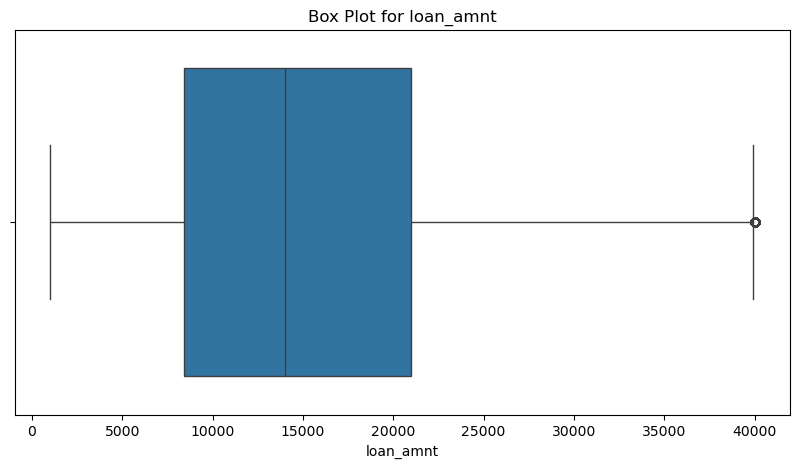

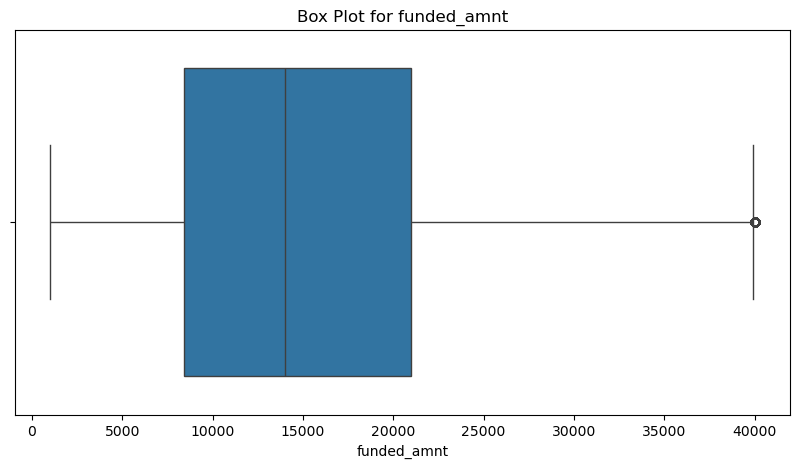

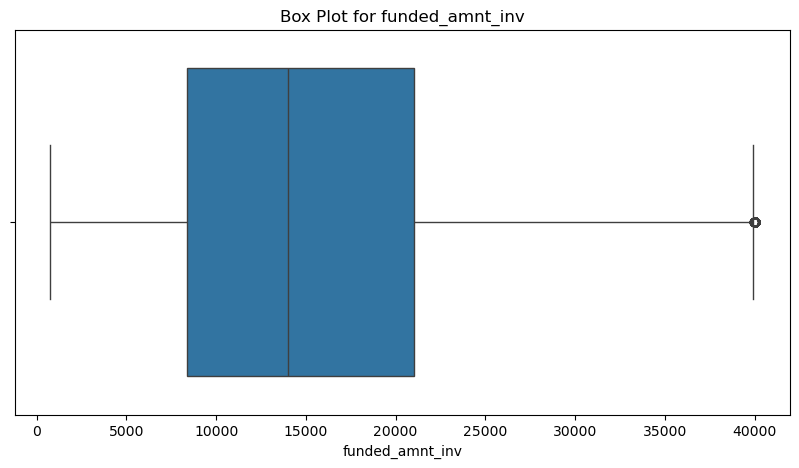

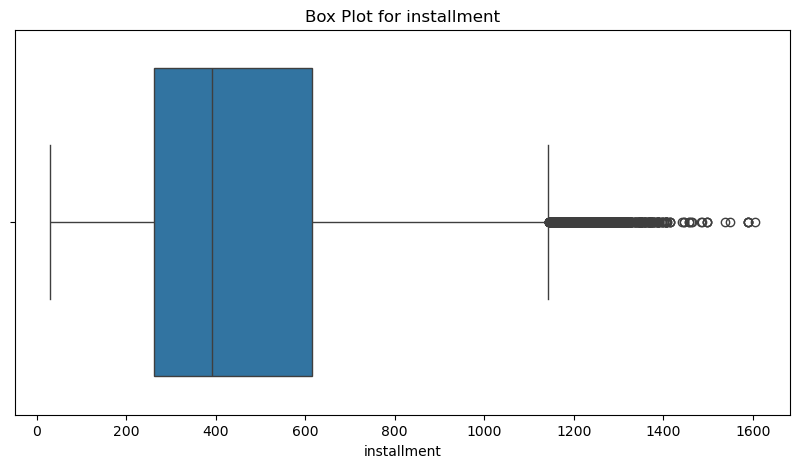

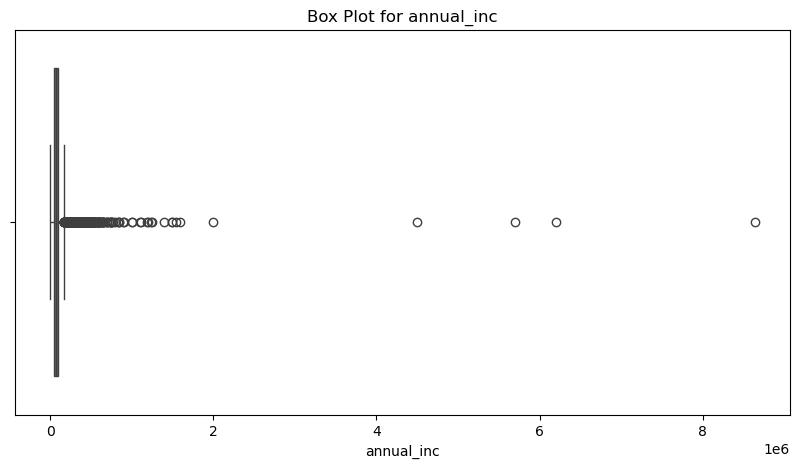

...

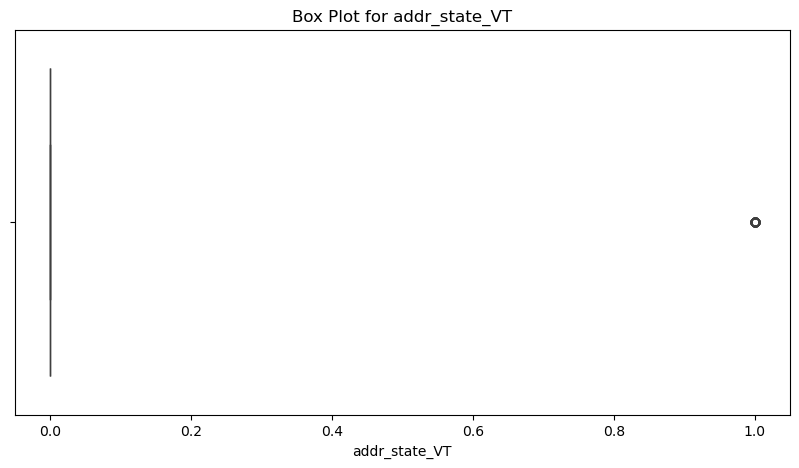

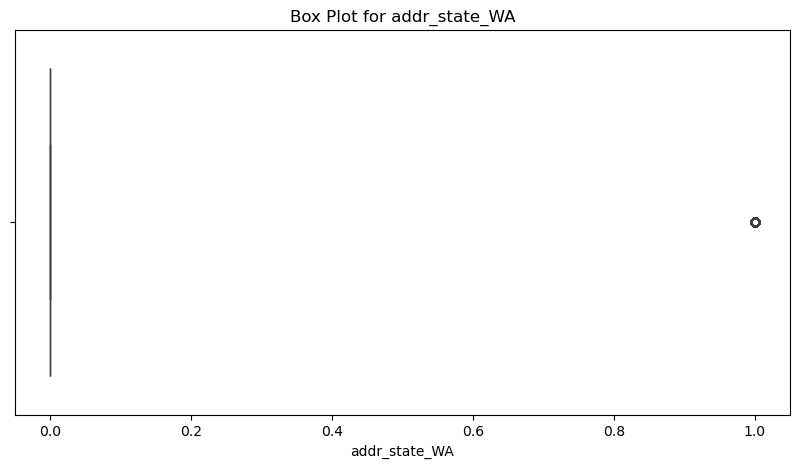

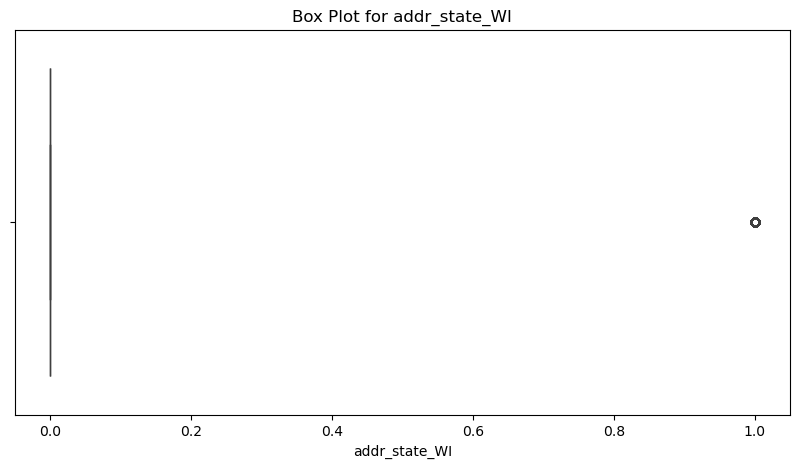

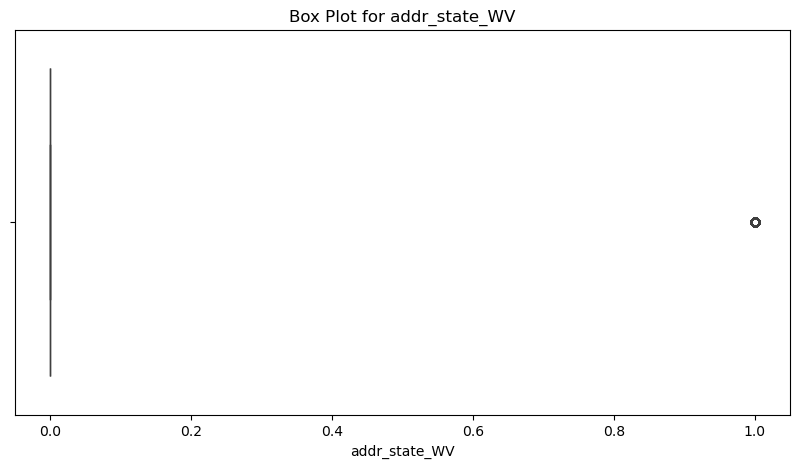

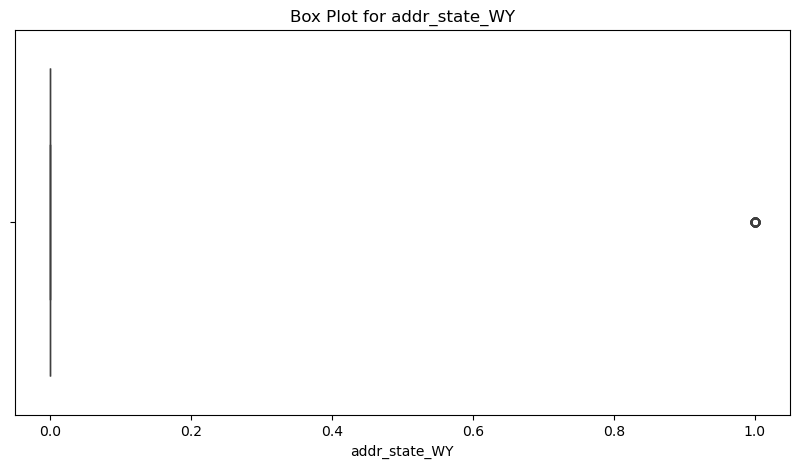

In [48]:
for col in df.columns:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=df[col])
    plt.title(f'Box Plot for {col}')
    plt.show()

In [49]:
# cols_to_check = ['recoveries', 'collection_recovery_fee', 'total_rec_late_fee', 'mo_sin_old_rev_tl_op', 'total_rev_hi_lim', 'mths_since_recent_bc', 'last_fico_range_high', 'last_fico_range_low']
cols_to_check = ['mo_sin_old_rev_tl_op', 'mths_since_recent_bc', 'last_fico_range_high', 'last_fico_range_low']

In [50]:
df[cols_to_check].describe()

,mo_sin_old_rev_tl_op,mths_since_recent_bc,last_fico_range_high,last_fico_range_low
count,42060.000000,42060.000000,42060.000000,42060.000000
mean,174.094032,23.415668,689.705350,677.149548
std,91.826049,30.220263,75.007639,114.242113
min,5.000000,0.000000,0.000000,0.000000
25%,112.000000,6.000000,654.000000,650.000000
50%,159.000000,13.000000,699.000000,695.000000
75%,222.000000,28.000000,739.000000,735.000000
max,746.000000,502.000000,850.000000,845.000000


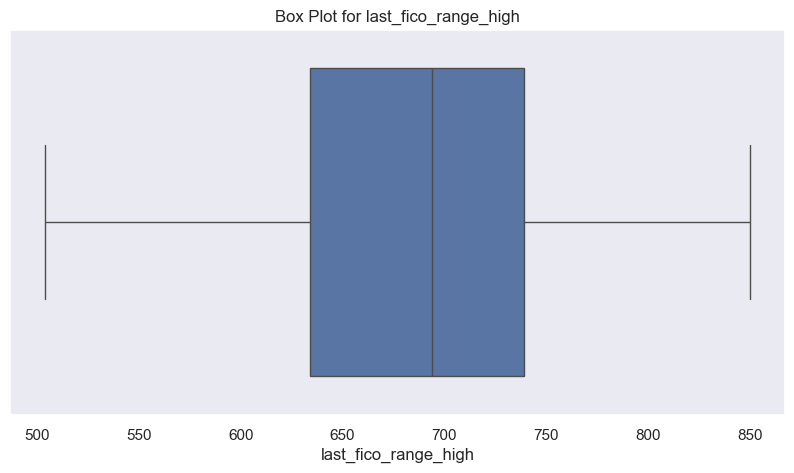

In [168]:
col = 'last_fico_range_high'
plt.figure(figsize=(10, 5))
sns.boxplot(x=df[col])
plt.title(f'Box Plot for {col}')
plt.show()

In [52]:
df[col].value_counts()

last_fico_range_high
709.0    1541
714.0    1487
694.0    1473
704.0    1469
699.0    1465
719.0    1415
684.0    1343
724.0    1340
689.0    1327
734.0    1324
729.0    1240
679.0    1136
674.0    1106
739.0    1054
744.0    1045
669.0    1015
754.0     925
749.0     868
664.0     832
759.0     812
769.0     729
499.0     727
659.0     717
764.0     716
654.0     664
774.0     652
784.0     645
779.0     631
644.0     534
789.0     530
649.0     517
794.0     481
799.0     448
624.0     401
634.0     397
639.0     395
804.0     391
629.0     368
614.0     368
809.0     352
599.0     328
619.0     322
544.0     321
574.0     315
549.0     314
604.0     313
579.0     312
609.0     311
554.0     308
589.0     303
584.0     301
564.0     296
594.0     291
569.0     281
814.0     274
534.0     265
559.0     265
539.0     254
529.0     234
819.0     229
519.0     199
524.0     199
509.0     196
514.0     192
504.0     159
824.0     152
829.0     117
834.0      72
839.0      31
844.0      19

In [53]:
df = df[df[col] != 0]

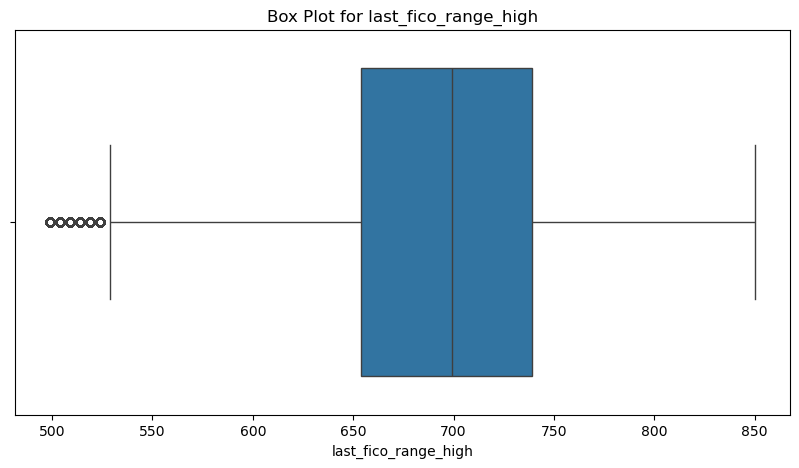

In [54]:
plt.figure(figsize=(10, 5))
sns.boxplot(x=df[col])
plt.title(f'Box Plot for {col}')
plt.show()

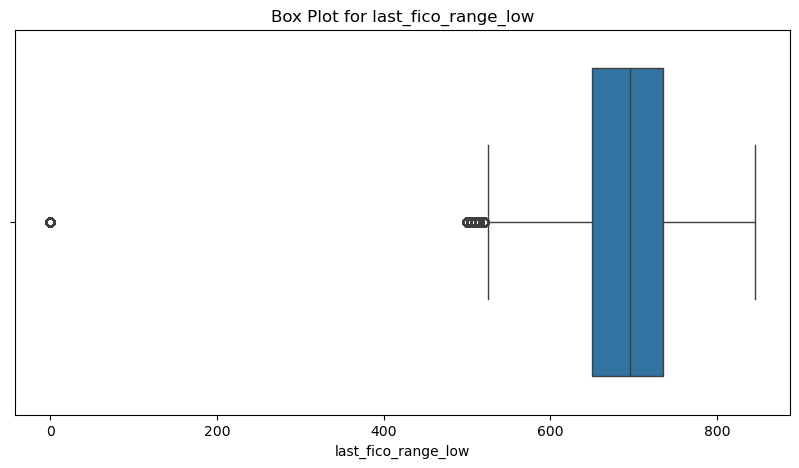

In [55]:
col = 'last_fico_range_low'
plt.figure(figsize=(10, 5))
sns.boxplot(x=df[col])
plt.title(f'Box Plot for {col}')
plt.show()

In [56]:
df[col].value_counts()

last_fico_range_low
705.0    1541
710.0    1487
690.0    1473
700.0    1469
695.0    1465
715.0    1415
680.0    1343
720.0    1340
685.0    1327
730.0    1324
725.0    1240
675.0    1136
670.0    1106
735.0    1054
740.0    1045
665.0    1015
750.0     925
745.0     868
660.0     832
755.0     812
765.0     729
0.0       727
655.0     717
760.0     716
650.0     664
770.0     652
780.0     645
775.0     631
640.0     534
785.0     530
645.0     517
790.0     481
795.0     448
620.0     401
630.0     397
635.0     395
800.0     391
610.0     368
625.0     368
805.0     352
595.0     328
615.0     322
540.0     321
570.0     315
545.0     314
600.0     313
575.0     312
605.0     311
550.0     308
585.0     303
580.0     301
560.0     296
590.0     291
565.0     281
810.0     274
555.0     265
530.0     265
535.0     254
525.0     234
815.0     229
515.0     199
520.0     199
505.0     196
510.0     192
500.0     159
820.0     152
825.0     117
830.0      72
835.0      31
840.0      19


In [57]:
df = df[df[col] != 0]

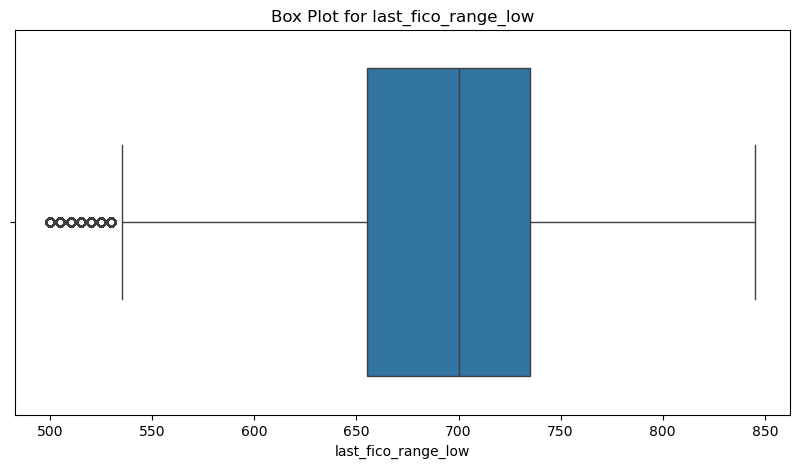

In [58]:
plt.figure(figsize=(10, 5))
sns.boxplot(x=df[col])
plt.title(f'Box Plot for {col}')
plt.show()

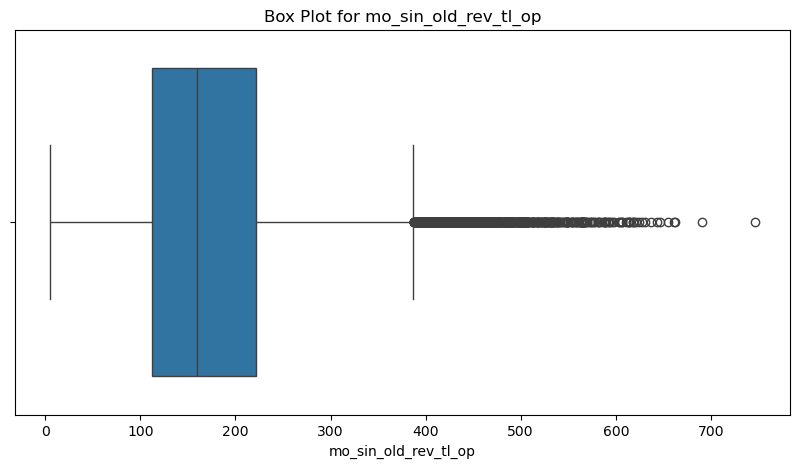

In [59]:
col = 'mo_sin_old_rev_tl_op'
plt.figure(figsize=(10, 5))
sns.boxplot(x=df[col])
plt.title(f'Box Plot for {col}')
plt.show()

In [60]:
col_def(col)

mo_sin_old_rev_tl_op
Months since oldest revolving account opened



In [61]:
print(f'{max(df[col])} months is {max(df[col])/12:.2f} years.')

746.0 months is 62.17 years.


In [62]:
col_def('earliest_cr_line')

earliest_cr_line
The month the borrower's earliest reported credit line was opened



In [63]:
potential_outliers = df[df[col] > 400]
potential_outliers['earliest_cr_line_year'].describe()

count     954.000000
mean     1978.389937
std         4.873095
min      1957.000000
25%      1976.000000
50%      1979.000000
75%      1982.000000
max      1987.000000
Name: earliest_cr_line_year, dtype: float64

In [64]:
2015-1957

58

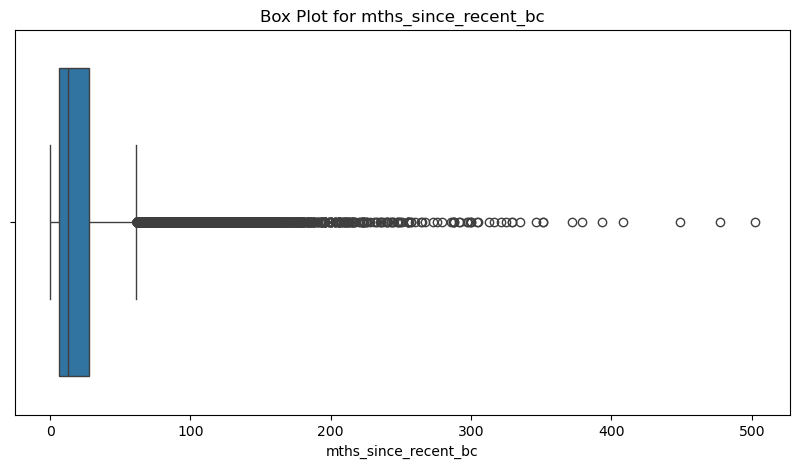

In [65]:
col = 'mths_since_recent_bc'
plt.figure(figsize=(10, 5))
sns.boxplot(x=df[col])
plt.title(f'Box Plot for {col}')
plt.show()

In [66]:
col_def(col)

mths_since_recent_bc
Months since most recent bankcard account opened.



In [67]:
print(f'{max(df[col])} months is {max(df[col])/12:.2f} years.')

502.0 months is 41.83 years.


# Only Keep 'Fully Paid,' 'Charged off,' and 'Current' loans

In [68]:
df['loan_status'].value_counts()

loan_status
Fully Paid            21896
Current               14538
Charged Off            4639
Late (31-120 days)      139
In Grace Period          75
Late (16-30 days)        29
Default                   7
Issued                    7
Name: count, dtype: int64

In [69]:
# df.loc[df['loan_status'].isin(['Fully Paid', 'Charged Off']), 'loan_status'] = df['loan_status'].map({'Fully Paid': 1, 'Charged Off': 0})
df = df.loc[df['loan_status'].isin(['Fully Paid', 'Charged Off', 'Current'])]

In [70]:
df_current = df.loc[df['loan_status'] == 'Current']

In [71]:
df = df.loc[df['loan_status'].isin(['Fully Paid', 'Charged Off'])]

In [72]:
df['loan_status_num'] = df['loan_status'].apply(lambda x: 1 if x == 'Fully Paid' else 0)
df = df.drop(columns='loan_status')

# Feature Selection

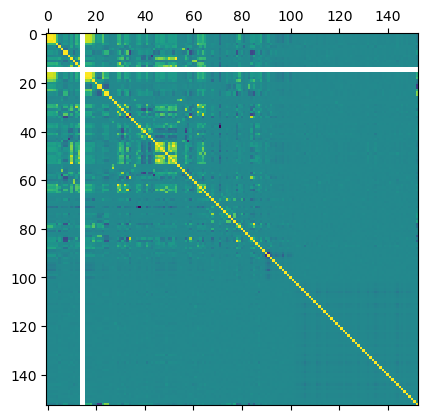

In [73]:
plt.matshow(df.corr())
plt.show()

In [74]:
corr_with_loan = df.corr()['loan_status_num'].sort_values(ascending=False, key=abs)
corr_with_loan

loan_status_num               1.000000
last_fico_range_low           0.631335
last_fico_range_high          0.631334
recoveries                   -0.543985
collection_recovery_fee      -0.527573
total_rec_prncp               0.410260
debt_settlement_flag_num     -0.356827
last_pymnt_amnt               0.326877
total_pymnt                   0.281065
total_pymnt_inv               0.281031
sub_grade_num                -0.256505
int_rate_num                 -0.251614
last_credit_pull_d_year       0.219103
term_num                     -0.182565
last_credit_pull_d_month_x    0.123355
total_rec_late_fee           -0.121793
fico_range_low                0.109706
fico_range_high               0.109705
last_pymnt_d_year             0.109705
acc_open_past_24mths         -0.098531
dti                          -0.084034
num_tl_op_past_12m           -0.082286
funded_amnt_inv              -0.077261
funded_amnt                  -0.077243
loan_amnt                    -0.077228
bc_open_to_buy           

In [75]:
corr_with_loan[abs(corr_with_loan) > 0.05]

loan_status_num               1.000000
last_fico_range_low           0.631335
last_fico_range_high          0.631334
recoveries                   -0.543985
collection_recovery_fee      -0.527573
total_rec_prncp               0.410260
debt_settlement_flag_num     -0.356827
last_pymnt_amnt               0.326877
total_pymnt                   0.281065
total_pymnt_inv               0.281031
sub_grade_num                -0.256505
int_rate_num                 -0.251614
last_credit_pull_d_year       0.219103
term_num                     -0.182565
last_credit_pull_d_month_x    0.123355
total_rec_late_fee           -0.121793
fico_range_low                0.109706
fico_range_high               0.109705
last_pymnt_d_year             0.109705
acc_open_past_24mths         -0.098531
dti                          -0.084034
num_tl_op_past_12m           -0.082286
funded_amnt_inv              -0.077261
funded_amnt                  -0.077243
loan_amnt                    -0.077228
bc_open_to_buy           

In [76]:
above_5_perc = corr_with_loan[abs(corr_with_loan) > 0.05].index.values.tolist()

In [77]:
above_5_perc

['loan_status_num',
 'last_fico_range_low',
 'last_fico_range_high',
 'recoveries',
 'collection_recovery_fee',
 'total_rec_prncp',
 'debt_settlement_flag_num',
 'last_pymnt_amnt',
 'total_pymnt',
 'total_pymnt_inv',
 'sub_grade_num',
 'int_rate_num',
 'last_credit_pull_d_year',
 'term_num',
 'last_credit_pull_d_month_x',
 'total_rec_late_fee',
 'fico_range_low',
 'fico_range_high',
 'last_pymnt_d_year',
 'acc_open_past_24mths',
 'dti',
 'num_tl_op_past_12m',
 'funded_amnt_inv',
 'funded_amnt',
 'loan_amnt',
 'bc_open_to_buy',
 'mort_acc',
 'avg_cur_bal',
 'num_rev_tl_bal_gt_0',
 'num_actv_rev_tl',
 'verification_status_num',
 'tot_hi_cred_lim',
 'inq_last_6mths',
 'total_rec_int',
 'total_bc_limit',
 'installment',
 'tot_cur_bal',
 'mo_sin_rcnt_tl',
 'mths_since_recent_inq',
 'percent_bc_gt_75',
 'bc_util',
 'mo_sin_rcnt_rev_tl_op']

## Modifiable Features

In [78]:
df.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment',
       'annual_inc', 'dti', 'delinq_2yrs', 'fico_range_low', 'fico_range_high',
       'inq_last_6mths',
       ...
       'addr_state_TN', 'addr_state_TX', 'addr_state_UT', 'addr_state_VA',
       'addr_state_VT', 'addr_state_WA', 'addr_state_WI', 'addr_state_WV',
       'addr_state_WY', 'loan_status_num'],
      dtype='object', length=153)

In [79]:
for col in df.columns:
    print(col)

loan_amnt
funded_amnt
funded_amnt_inv
installment
annual_inc
dti
delinq_2yrs
fico_range_low
fico_range_high
inq_last_6mths
open_acc
pub_rec
revol_bal
total_acc
out_prncp
out_prncp_inv
total_pymnt
total_pymnt_inv
total_rec_prncp
total_rec_int
total_rec_late_fee
recoveries
collection_recovery_fee
last_pymnt_amnt
last_fico_range_high
last_fico_range_low
collections_12_mths_ex_med
acc_now_delinq
tot_coll_amt
tot_cur_bal
total_rev_hi_lim
acc_open_past_24mths
avg_cur_bal
bc_open_to_buy
bc_util
chargeoff_within_12_mths
delinq_amnt
mo_sin_old_il_acct
mo_sin_old_rev_tl_op
mo_sin_rcnt_rev_tl_op
mo_sin_rcnt_tl
mort_acc
mths_since_recent_bc
mths_since_recent_inq
num_accts_ever_120_pd
num_actv_bc_tl
num_actv_rev_tl
num_bc_sats
num_bc_tl
num_il_tl
num_op_rev_tl
num_rev_accts
num_rev_tl_bal_gt_0
num_sats
num_tl_120dpd_2m
num_tl_30dpd
num_tl_90g_dpd_24m
num_tl_op_past_12m
pct_tl_nvr_dlq
percent_bc_gt_75
pub_rec_bankruptcies
tax_liens
tot_hi_cred_lim
total_bal_ex_mort
total_bc_limit
total_il_high_credi

In [80]:
col_def('loan_amnt')
col_def('funded_amnt')
col_def('funded_amnt_inv')

col_def('installment')
col_def('issue_d')
col_def('int_rate')
col_def('term')
col_def('initial_list_status')
col_def('verification_status')

loan_amnt
The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

funded_amnt
The total amount committed to that loan at that point in time.

funded_amnt_inv
The total amount committed by investors for that loan at that point in time.

installment
The monthly payment owed by the borrower if the loan originates.

issue_d
The month which the loan was funded

int_rate
Interest Rate on the loan

term
The number of payments on the loan. Values are in months and can be either 36 or 60.

initial_list_status
The initial listing status of the loan. Possible values are – W, F

verification_status
Indicates if income was verified by LC, not verified, or if the income source was verified



In [81]:
mod_feats = ['loan_amnt',
'funded_amnt',
'funded_amnt_inv',
'installment',
'issue_d_month_x',
'issue_d_month_y',
'issue_d_year',
'int_rate_num',
'term_num',
'initial_list_status_num',
'verification_status_num']

In [82]:
len(above_5_perc)

42

In [83]:
for feat in mod_feats:
    if feat not in above_5_perc:
        above_5_perc.append(feat)
len(above_5_perc)

46

## Correlation Matrices

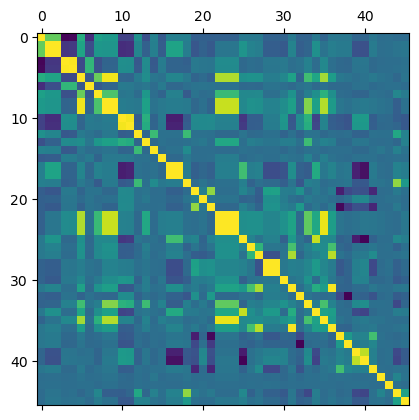

In [84]:
plt.matshow(df[above_5_perc].corr())
plt.show()

<Axes: >

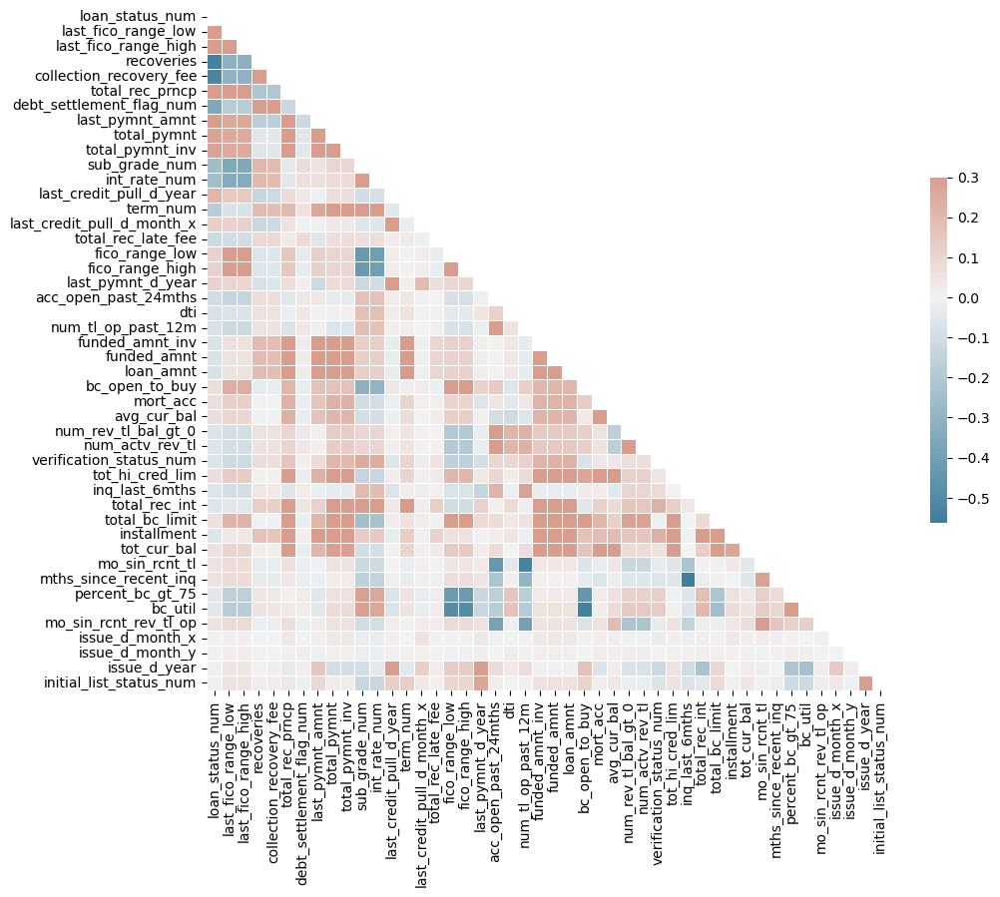

In [85]:
# a fancier and more readable correlation map
# corr = corr_with_loan[abs(corr_with_loan) > 0.05]
corr = df[above_5_perc].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [86]:
# sns.set_style('whitegrid')
# sns.pairplot(df[above_5_perc].sample(1000), hue = 'loan_status_num', diag_kind='kde')
# plt.show()

## Discarded Columns

In [87]:
discarded_cols = corr_with_loan[abs(corr_with_loan) <= 0.05]

In [88]:
for col in discarded_cols.index:
    try:
        print(f'{discarded_cols[col]:.4f}')
        col_def(col)
    except KeyError:
        try:
            col_def(col.replace('_num', ''))
        except KeyError:
            print('NO DESCRIPTION')
    print()

0.0475
annual_inc
The self-reported annual income provided by the borrower during registration.


0.0470
total_rev_hi_lim
Total revolving high credit/credit limit


-0.0460
revol_util_num
revol_util
Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.


0.0437
mths_since_recent_bc
Months since most recent bankcard account opened.


0.0437
home_ownership_num
home_ownership
The home ownership status provided by the borrower during registration or obtained from the credit report. Our values are: RENT, OWN, MORTGAGE, OTHER


0.0403
mo_sin_old_rev_tl_op
Months since oldest revolving account opened


-0.0402
num_op_rev_tl
Number of open revolving accounts


-0.0399
num_actv_bc_tl
Number of currently active bankcard accounts


0.0394
last_pymnt_d_month_x
last_pymnt_d_month_x
NO DESCRIPTION

-0.0385
num_sats
Number of satisfactory accounts


-0.0384
open_acc
The number of open credit lines in the borrower's credit file.


-0

## Chosen Columns

In [89]:
for col in above_5_perc:
    try:
        print(f'{corr_with_loan[col]:.4f}')
        col_def(col)
    except KeyError:
        try:
            col_def(col.replace('_num', ''))
        except KeyError:
            print('NO DESCRIPTION')
    print()

1.0000
loan_status_num
loan_status
Current status of the loan


0.6313
last_fico_range_low
The lower boundary range the borrower’s last FICO pulled belongs to.


0.6313
last_fico_range_high
The upper boundary range the borrower’s last FICO pulled belongs to.


-0.5440
recoveries
post charge off gross recovery


-0.5276
collection_recovery_fee
post charge off collection fee


0.4103
total_rec_prncp
Principal received to date


-0.3568
debt_settlement_flag_num
debt_settlement_flag
Flags whether or not the borrower, who has charged-off, is working with a debt-settlement company.


0.3269
last_pymnt_amnt
Last total payment amount received


0.2811
total_pymnt
Payments received to date for total amount funded


0.2810
total_pymnt_inv
Payments received to date for portion of total amount funded by investors


-0.2565
sub_grade_num
sub_grade
LC assigned loan subgrade


-0.2516
int_rate_num
int_rate
Interest Rate on the loan


0.2191
last_credit_pull_d_year
last_credit_pull_d_year
NO DESCRIPTI

# Model Building

In [90]:
df_model = df[above_5_perc]

## Parameter Initialization and Function Definitions

In [91]:
train_size = 0.8
test_size = 0.2
random_state = 42
loan_status_values = ['Charged off', 'Fully payed']
target = 'loan_status_num'
num_folds = 5
scoring = 'accuracy'
class_weights = {0: 1, 1: 1}

In [92]:
#  Display the confusion matrix of results to show true/false positives/negatives

def print_confusion_matrix(y_test, y_pred, classifier, labels):
    cm = confusion_matrix(y_test, y_pred, labels=classifier.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=labels)
    print('Prediction on test data:\n')
    # remove grid lines
    sns.set(rc={'axes.grid': False})
    disp.plot()
    plt.show()

In [93]:
# Display metrics about the model such as precision, recall, etc.

def print_classification_report(y_test, y_pred, classifier, digits=2):
    print('Classification report:\n')
    print(classification_report(y_test, y_pred, target_names=loan_status_values, digits=digits))

In [94]:
# Automates the grid search and cross validation process

def perform_grid_search(classifier, param_grid, X_train, y_train):
    grid_search = GridSearchCV(classifier, param_grid, cv=num_folds, scoring=scoring, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    print('Best parameters:', grid_search.best_params_)
    return grid_search, grid_search.best_estimator_

In [95]:
# Provides a train/test split of the data

def setup_train_test(df, target):
    # split data into features and target
    X = df.drop(target, axis=1)
    y = df[target]
    # split data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    return X, y, X_train, X_test, y_train, y_test

In [97]:
# After performing grid search on a model, this function is used to show the results such as accuracy, other metrics, and the confusion matrix

def compute_results(gs: GridSearchCV, classifier, X_test, y_test, digits=2):
    print('Mean cross-validated score of the best_estimator:', gs.best_score_)
    print('Accuracy on test data:', gs.score(X_test, y_test))
    y_pred = classifier.predict(X_test)
    print_classification_report(y_test, y_pred, classifier, digits)
    print_confusion_matrix(y_test, y_pred, classifier, loan_status_values)

## KNN

Best parameters: {'knn__leaf_size': 15, 'knn__n_neighbors': 5, 'knn__weights': 'distance'}
Mean cross-validated score of the best_estimator: 0.9577918550931604
Accuracy on test data: 0.9630676465046165
Classification report:

              precision    recall  f1-score   support

           0       0.94      0.84      0.89       915
           1       0.97      0.99      0.98      4392

    accuracy                           0.96      5307
   macro avg       0.95      0.92      0.93      5307
weighted avg       0.96      0.96      0.96      5307

Prediction on test data:



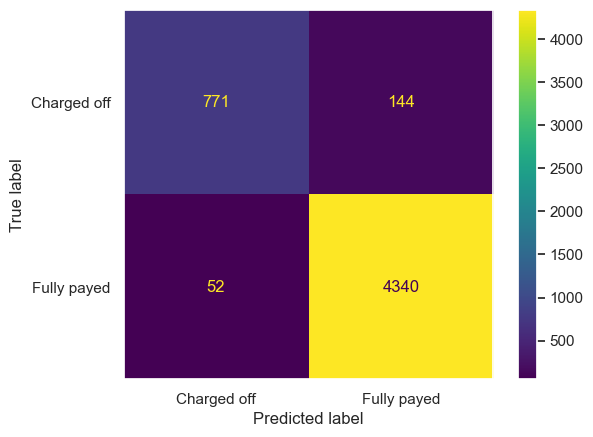

In [ ]:
X, y, X_train, X_test, y_train, y_test = setup_train_test(df_model, target)
knn_pipe = Pipeline([('mms', MinMaxScaler()), ('knn', KNeighborsClassifier())])
params = [{'knn__n_neighbors': [3, 5, 7, 9, 11],
         'knn__weights': ['uniform', 'distance'],
         'knn__leaf_size': [15, 30, 45]}]
knn_gs, knn_best = perform_grid_search(knn_pipe, params, X_train, y_train)

compute_results(knn_gs, knn_best, X_test, y_test)

## Naive Bayes

### MultinomialNB

/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/naive_bayes.py:898: RuntimeWarning: divide by zero encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/naive_bayes.py:898: RuntimeWarning: divide by zero encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/naive_bayes.py:898: RuntimeWarning: divide by zero encountered in log
  self.feature_log_prob_ = np.log(smoothed_fc) - np.log(
/Users/ben/opt/anaconda3/envs/data-mining/lib/py

Best parameters: {'alpha': 0, 'fit_prior': False, 'force_alpha': False}
Mean cross-validated score of the best_estimator: 0.9581211555308482
Accuracy on test data: 0.9655172413793104
Classification report:

              precision    recall  f1-score   support

           0       0.87      0.94      0.90       915
           1       0.99      0.97      0.98      4392

    accuracy                           0.97      5307
   macro avg       0.93      0.95      0.94      5307
weighted avg       0.97      0.97      0.97      5307

Prediction on test data:



/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/naive_bayes.py:623: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10. Use `force_alpha=True` to keep alpha unchanged.
  warnings.warn(


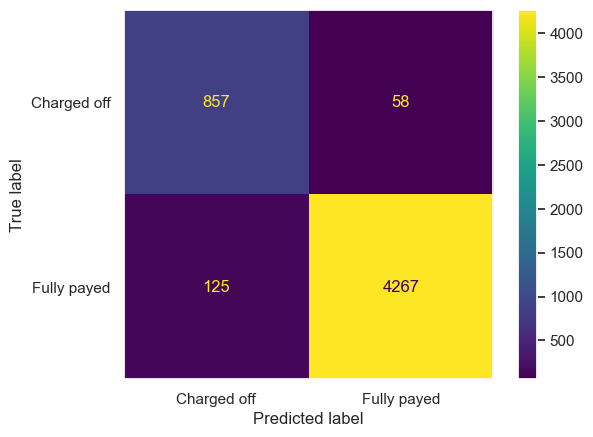

In [ ]:
X, y, X_train, X_test, y_train, y_test = setup_train_test(df_model, target)
params = {'alpha': [0, 0.1, 0.5, 1.0, 2.0, 5.0],
          'force_alpha': [True, False],
          'fit_prior': [True, False]}

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled_X = scaler.fit_transform(X)
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.fit_transform(X_test)
mnb_gs, mnb_best = perform_grid_search(MultinomialNB(), param_grid=params, X_train=scaled_X_train, y_train=y_train)

compute_results(mnb_gs, mnb_best, scaled_X_test, y_test)

### GaussianNB

/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/naive_bayes.py:513: RuntimeWarning: divide by zero encountered in log
  n_ij = -0.5 * np.sum(np.log(2.0 * np.pi * self.var_[i, :]))
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/naive_bayes.py:514: RuntimeWarning: divide by zero encountered in divide
  n_ij -= 0.5 * np.sum(((X - self.theta_[i, :]) ** 2) / (self.var_[i, :]), 1)
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/naive_bayes.py:514: RuntimeWarning: invalid value encountered in divide
  n_ij -= 0.5 * np.sum(((X - self.theta_[i, :]) ** 2) / (self.var_[i, :]), 1)
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/naive_bayes.py:514: RuntimeWarning: invalid value encountered in subtract
  n_ij -= 0.5 * np.sum(((X - self.theta_[i, :]) ** 2) / (self.var_[i, :]), 1)
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/naive_bayes.py:513: 

Best parameters: {'var_smoothing': 0.5}
Mean cross-validated score of the best_estimator: 0.9357452257428456
Accuracy on test data: 0.9432824571320897
Classification report:

              precision    recall  f1-score   support

           0       0.91      0.75      0.82       915
           1       0.95      0.98      0.97      4392

    accuracy                           0.94      5307
   macro avg       0.93      0.87      0.89      5307
weighted avg       0.94      0.94      0.94      5307

Prediction on test data:



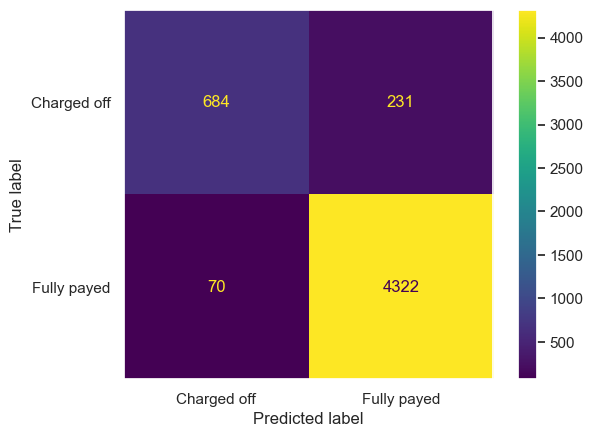

In [ ]:
from sklearn.naive_bayes import GaussianNB

X, y, X_train, X_test, y_train, y_test = setup_train_test(df_model, target)
params = {'var_smoothing': [0, 0.1, 0.5, 1.0, 2.0, 5.0]}

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled_X = scaler.fit_transform(X)
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.fit_transform(X_test)
gnb_gs, gnb_best = perform_grid_search(GaussianNB(), param_grid=params, X_train=scaled_X_train, y_train=y_train)

compute_results(gnb_gs, gnb_best, scaled_X_test, y_test)

## SVM

Best parameters: {'svc__C': 100, 'svc__gamma': 0.001}
Mean cross-validated score of the best_estimator: 0.9948750000000001
Accuracy on test data: 0.9955
Classification report:

              precision    recall  f1-score   support

           0       1.00      0.97      0.99       340
           1       0.99      1.00      1.00      1660

    accuracy                           1.00      2000
   macro avg       1.00      0.99      0.99      2000
weighted avg       1.00      1.00      1.00      2000

Prediction on test data:



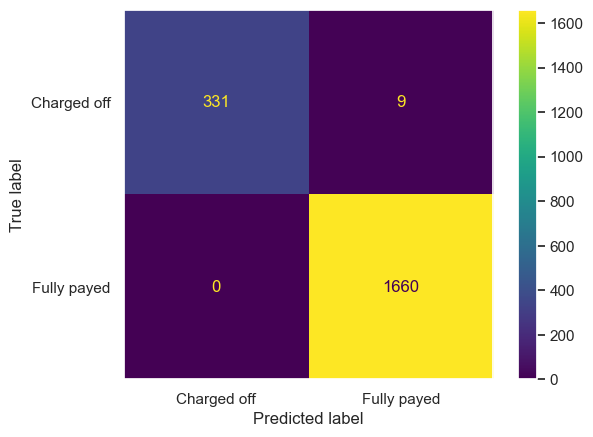

In [ ]:
X, y, X_train, X_test, y_train, y_test = setup_train_test(df_model.sample(10000), target)
svm_pipe = make_pipeline(StandardScaler(), SVC(kernel='rbf'))
params = [{'svc__C': [0.1, 1, 10, 100], 'svc__gamma': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]}]
svm_gs, svm_best = perform_grid_search(svm_pipe, params, X_train, y_train)

compute_results(svm_gs, svm_best, X_test, y_test)

## Decision Tree

Best parameters: {'criterion': 'log_loss'}
Mean cross-validated score of the best_estimator: 0.99312230675639
Accuracy on test data: 0.9973619747503297
Classification report:

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       915
           1       1.00      1.00      1.00      4392

    accuracy                           1.00      5307
   macro avg       1.00      1.00      1.00      5307
weighted avg       1.00      1.00      1.00      5307

Prediction on test data:



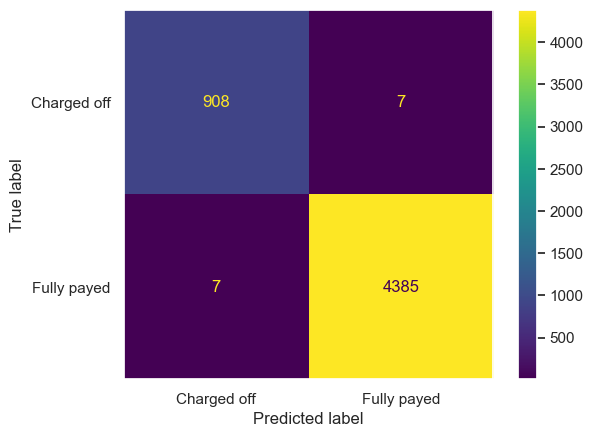

In [ ]:
X, y, X_train, X_test, y_train, y_test = setup_train_test(df_model, target)
# svm_pipe = Pipeline([('ss', StandardScaler()), ('svc', SVC(kernel='rbf'))])
# dt_pipe = make_pipeline(tree.DecisionTreeClassifier())
dt_pipe = tree.DecisionTreeClassifier()
params = [{'criterion': ['gini', 'entropy', 'log_loss']},
          {'splitter': ['best', 'random'],
           'max_depth': [5, 10, 15, 20],
           'min_samples_split': [2, 5, 10],
           'min_samples_leaf': [1, 2, 4],
           'max_features': ['sqrt', 'log2'],
           'ccp_alpha': [0.05, 0.005, 0.0005]}]
dt_gs, dt_best = perform_grid_search(dt_pipe, params, X_train, y_train)

compute_results(dt_gs, dt_best, X_test, y_test)

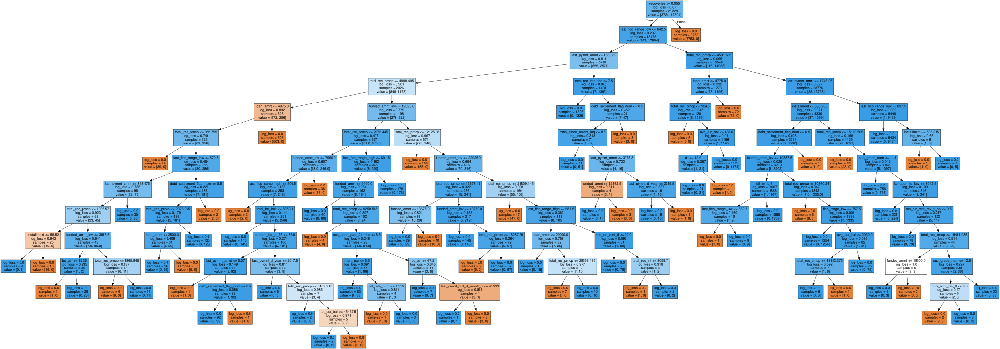

In [124]:
dot_data_2 = tree.export_graphviz(dt_best, out_file=None, feature_names=list(df_model.drop(columns=target).columns), filled=True)

# Draw graph
graph = graphviz.Source(dot_data_2, format="png")
graph

## Random Forest

Best parameters: {'randomforestclassifier__max_depth': 10, 'randomforestclassifier__max_features': 'sqrt', 'randomforestclassifier__min_samples_leaf': 1, 'randomforestclassifier__min_samples_split': 2, 'randomforestclassifier__n_estimators': 1000}
Mean cross-validated score of the best_estimator: 0.9775
Accuracy on test data: 1.0
Classification report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        16
           1       1.00      1.00      1.00        84

    accuracy                           1.00       100
   macro avg       1.00      1.00      1.00       100
weighted avg       1.00      1.00      1.00       100

Prediction on test data:



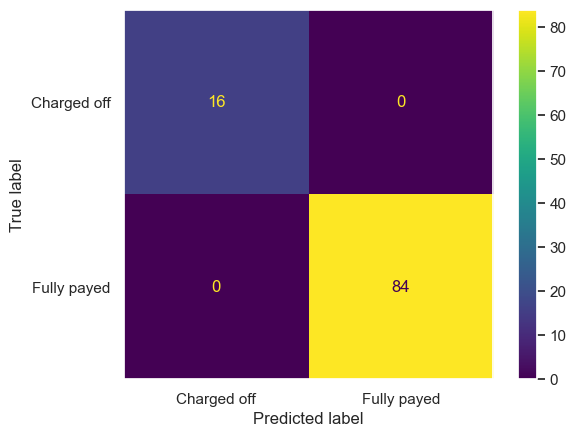

In [125]:
from sklearn.ensemble import RandomForestClassifier

X, y, X_train, X_test, y_train, y_test = setup_train_test(df_model.sample(500), target)
rf_pipe = make_pipeline(StandardScaler(), RandomForestClassifier())
params = [{'randomforestclassifier__n_estimators': [10, 100, 1000],
           'randomforestclassifier__max_features': ['sqrt', 'log2'],
           'randomforestclassifier__max_depth': [5, 10, 15, 20],
           'randomforestclassifier__min_samples_split': [2, 5, 10],
           'randomforestclassifier__min_samples_leaf': [1, 2, 4]}]
gs, rf_best = perform_grid_search(rf_pipe, params, X_train, y_train)

compute_results(gs, rf_best, X_test, y_test)

## AdaBoost

Best parameters: {'adaboostclassifier__learning_rate': 1.0, 'adaboostclassifier__n_estimators': 1000}
Mean cross-validated score of the best_estimator: 0.99
Accuracy on test data: 0.97
Classification report:

              precision    recall  f1-score   support

           0       0.97      0.89      0.93        44
           1       0.97      0.99      0.98       156

    accuracy                           0.97       200
   macro avg       0.97      0.94      0.95       200
weighted avg       0.97      0.97      0.97       200

Prediction on test data:



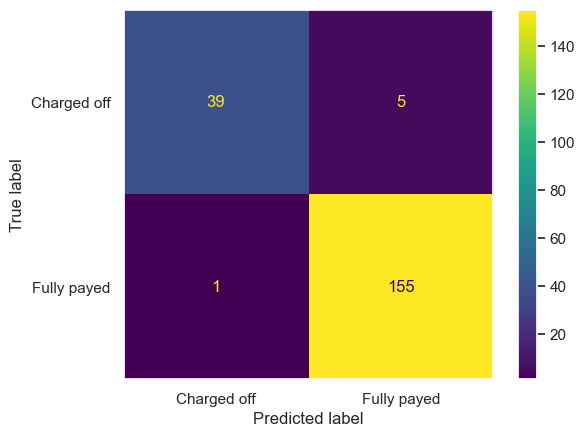

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

X, y, X_train, X_test, y_train, y_test = setup_train_test(df_model.sample(1000), target)
ada_pipe = make_pipeline(StandardScaler(), AdaBoostClassifier())
params = [{'adaboostclassifier__n_estimators': [10, 100, 1000],
           'adaboostclassifier__learning_rate': [0.1, 0.5, 1.0, 1.5, 2.0, 5.0]}]
ada_gs, ada_best = perform_grid_search(ada_pipe, params, X_train, y_train)

compute_results(ada_gs, ada_best, X_test, y_test)

## Logistic Regression

/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1196: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=None)
  warnings.warn(
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1196: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=None)
  warnings.warn(
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1196: UserWarning: l1_ratio parameter is on

Best parameters: {'logisticregression__C': 2, 'logisticregression__dual': False, 'logisticregression__fit_intercept': False, 'logisticregression__l1_ratio': 0, 'logisticregression__penalty': 'l1', 'logisticregression__solver': 'liblinear', 'logisticregression__tol': 1e-05, 'logisticregression__warm_start': False}
Mean cross-validated score of the best_estimator: 0.9967500000000001
Accuracy on test data: 0.997
Classification report:

              precision    recall  f1-score   support

 Charged off       1.00      0.98      0.99       178
 Fully payed       1.00      1.00      1.00       822

    accuracy                           1.00      1000
   macro avg       1.00      0.99      0.99      1000
weighted avg       1.00      1.00      1.00      1000

Prediction on test data:



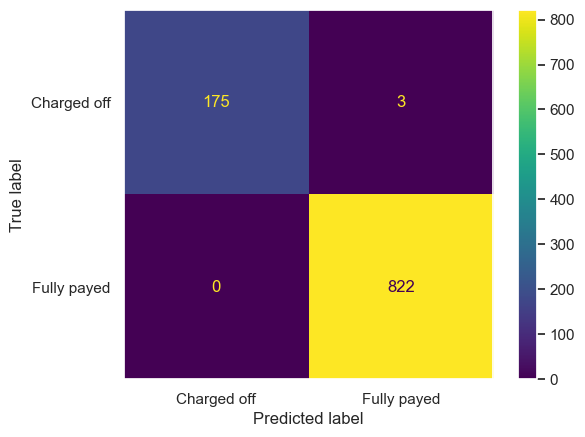

In [98]:
from sklearn.linear_model import LogisticRegression

X, y, X_train, X_test, y_train, y_test = setup_train_test(df_model.sample(5000), target)
log_pipe = make_pipeline(StandardScaler(), LogisticRegression())
params = [{'logisticregression__penalty': [None, 'l2', 'l1', 'elasticnet'],
           'logisticregression__dual': [False, True],
           'logisticregression__tol': [0.00001, 0.0001, 0.001, 0.01],
           'logisticregression__C': [2, 1, 0.5, 0.1],
           'logisticregression__fit_intercept': [False, True],
           'logisticregression__solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
        #    'logisticregression__max_iter': [10, 50, 100],
           'logisticregression__warm_start': [False, True],
           'logisticregression__l1_ratio': [0, 0.5, 1],
           }]
log_gs, log_best = perform_grid_search(log_pipe, params, X_train, y_train)

compute_results(log_gs, log_best, X_test, y_test)

Mean cross-validated score of the best_estimator: 0.9970000000000001
Accuracy on test data: 0.994
Classification report:

              precision    recall  f1-score   support

 Charged off      0.989     0.978     0.984       183
 Fully payed      0.995     0.998     0.996       817

    accuracy                          0.994      1000
   macro avg      0.992     0.988     0.990      1000
weighted avg      0.994     0.994     0.994      1000

Prediction on test data:



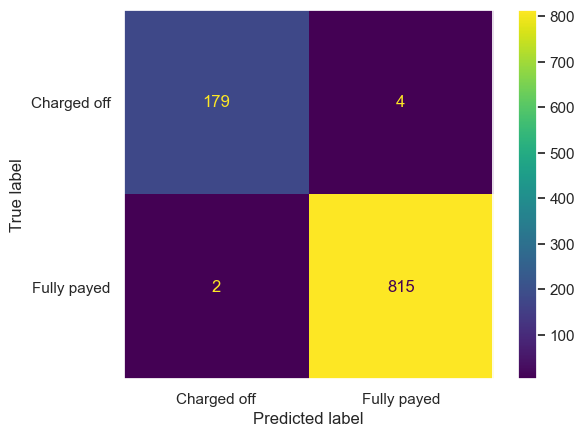

In [293]:
compute_results(log_gs, log_best, X_test, y_test, 3)

## Stacking

/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
60 fits failed out of a total of 120.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/ensemble/_stacking.py", line 148, in _method_name
    method_name = _check_response_method(estimator, method).__name__
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/ben/opt/anaconda3/envs/data-mining/lib/python3.11/site-packages/sklearn/utils/validation.py", line 2283, in _check_response_method
    raise AttributeError(
AttributeErro

Best parameters: {'stackingclassifier__cv': 5, 'stackingclassifier__n_jobs': 1000, 'stackingclassifier__passthrough': False, 'stackingclassifier__stack_method': 'auto', 'stackingclassifier__verbose': 0}
Mean cross-validated score of the best_estimator: 0.9967500000000001
Accuracy on test data: 0.998
Classification report:

              precision    recall  f1-score   support

           0       1.00      0.99      0.99       183
           1       1.00      1.00      1.00       817

    accuracy                           1.00      1000
   macro avg       1.00      0.99      1.00      1000
weighted avg       1.00      1.00      1.00      1000

Prediction on test data:



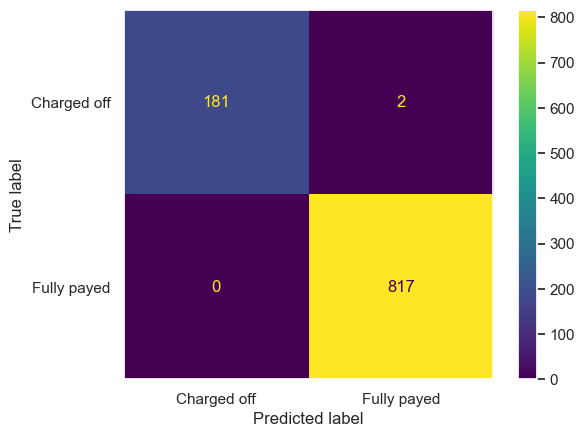

In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.svm import LinearSVC

estimators = [('rf', RandomForestClassifier()), ('svr', make_pipeline(StandardScaler(), LinearSVC()))]
X, y, X_train, X_test, y_train, y_test = setup_train_test(df_model.sample(5000), target)
stack_pipe = make_pipeline(StandardScaler(), StackingClassifier(estimators=estimators))
params = [{'stackingclassifier__n_jobs': [10, 100, 1000],
           'stackingclassifier__stack_method': ['auto', 'predict_proba', 'decision_function', 'predict'],
           'stackingclassifier__cv': [num_folds],
           'stackingclassifier__passthrough': [True, False],
           'stackingclassifier__verbose': [0]}]
stack_gs, stack_best = perform_grid_search(stack_pipe, params, X_train, y_train)

compute_results(stack_gs, stack_best, X_test, y_test)

# Maximizing Probability of Paying Back Loan

In [99]:
single_entry = df_model.sample(1)
prediction = log_best.predict_proba(single_entry.drop(columns=target))[0]
# print(f'Predicted probability of 0: {prediction[0]:.4f}')
# print(f'Predicted probability of 1: {prediction[1]:.4f}')
print(f'Predicted probability of 0: {prediction[0]}')
print(f'Predicted probability of 1: {prediction[1]}')
print('Actual:', single_entry[target].values[0])

Predicted probability of 0: 0.9999999994098159
Predicted probability of 1: 5.901840698598406e-10
Actual: 0


              precision    recall  f1-score   support

 Charged off       1.00      0.98      0.99      4639
 Fully payed       1.00      1.00      1.00     21896

    accuracy                           1.00     26535
   macro avg       1.00      0.99      1.00     26535
weighted avg       1.00      1.00      1.00     26535

Prediction on test data:



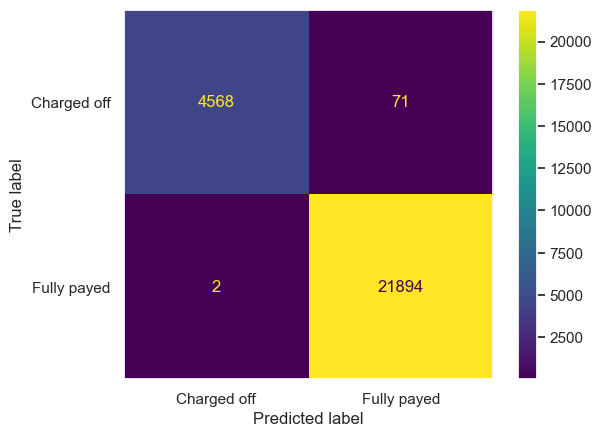

In [100]:
# def close(a, b, tol=1e-10):
#     if abs(a - b) < tol:
#         return True
#     return False

full_dataset = df[above_5_perc].drop(target, axis=1)
full_targets = df[target]
# full_predictions = log_best.predict_proba(full_dataset)
full_predictions = log_best.predict(full_dataset)

# print_classification_report(full_targets, full_predictions, log_best)
print(classification_report(full_targets, full_predictions, target_names=loan_status_values))
print_confusion_matrix(full_targets, full_predictions, log_best, loan_status_values)

# correct = 0
# for i in range(len(full_predictions)):
#     if (np.where(full_predictions[i] == max(full_predictions[i]))[0][0] == np.where(full_targets[i] == max(full_targets[i]))[0][0]):
#         correct += 1
# print(correct/len(full_predictions))
# np.where(prediction == max(prediction))[0][0]

              precision    recall  f1-score   support

 Charged off      1.000     0.985     0.992      4639
 Fully payed      0.997     1.000     0.998     21896

    accuracy                          0.997     26535
   macro avg      0.998     0.992     0.995     26535
weighted avg      0.997     0.997     0.997     26535

Prediction on test data:



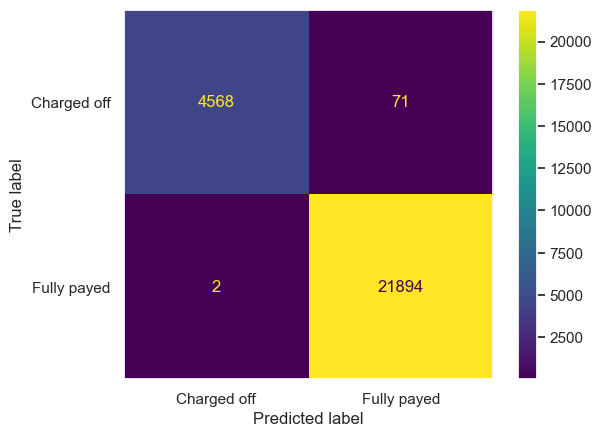

In [190]:
# def close(a, b, tol=1e-10):
#     if abs(a - b) < tol:
#         return True
#     return False

full_dataset = df[above_5_perc].drop(target, axis=1)
full_targets = df[target]
# full_predictions = log_best.predict_proba(full_dataset)
full_predictions = log_best.predict(full_dataset)

# print_classification_report(full_targets, full_predictions, log_best)
print(classification_report(full_targets, full_predictions, target_names=loan_status_values, digits=3))
print_confusion_matrix(full_targets, full_predictions, log_best, loan_status_values)

# correct = 0
# for i in range(len(full_predictions)):
#     if (np.where(full_predictions[i] == max(full_predictions[i]))[0][0] == np.where(full_targets[i] == max(full_targets[i]))[0][0]):
#         correct += 1
# print(correct/len(full_predictions))
# np.where(prediction == max(prediction))[0][0]

In [101]:
print(df[df['funded_amnt'] - df['funded_amnt_inv'] > 100].shape[0])
print(df[df['loan_amnt'] != df['funded_amnt']].shape[0])

# for simplicity, will assume funded_amnt = funded_amnt_inv = loan_amnt

341
1


In [113]:
from itertools import product
from random import randint

def iterate(entry: pd.DataFrame, target: str, model: Pipeline, mod_feats: list, values: list):
    entry_cp = entry.copy()
    max = 0
    max_vals = entry_cp[mod_feats].values.tolist()[0]
    i = 0
    for p in product(*values):
        if i % 1000 == 0:
            for feat, val in zip(mod_feats, p):
                entry_cp[feat] = val

            P = entry_cp['loan_amnt'].values[0]
            n = 36 if entry_cp['term_num'].values[0] == 0 else 60
            r = entry_cp['int_rate_num'].values[0]

            entry_cp['funded_amnt'] = P
            entry_cp['funded_amnt_inv'] = P
            entry_cp['installment'] = P * (r*(1 + r)**n) / ((1 + r)**n - 1)
            
            if model.predict_proba(entry_cp.drop(target, axis=1))[0][1] > max:
                max = model.predict_proba(entry_cp.drop(target, axis=1))[0][1]
                max_vals = entry_cp[mod_feats].values.tolist()[0]
        i += 1

    return (entry_cp, max, max_vals)

In [103]:
mod_feats

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'installment',
 'issue_d_month_x',
 'issue_d_month_y',
 'issue_d_year',
 'int_rate_num',
 'term_num',
 'initial_list_status_num',
 'verification_status_num']

In [104]:
col_def('loan_amnt')
col_def('funded_amnt')
col_def('funded_amnt_inv')

col_def('installment')
col_def('issue_d')
col_def('int_rate')
col_def('term')
col_def('initial_list_status')
col_def('verification_status')

loan_amnt
The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.

funded_amnt
The total amount committed to that loan at that point in time.

funded_amnt_inv
The total amount committed by investors for that loan at that point in time.

installment
The monthly payment owed by the borrower if the loan originates.

issue_d
The month which the loan was funded

int_rate
Interest Rate on the loan

term
The number of payments on the loan. Values are in months and can be either 36 or 60.

initial_list_status
The initial listing status of the loan. Possible values are – W, F

verification_status
Indicates if income was verified by LC, not verified, or if the income source was verified



In [105]:
df_model.sample(1)[mod_feats]

,loan_amnt,funded_amnt,funded_amnt_inv,installment,issue_d_month_x,issue_d_month_y,issue_d_year,int_rate_num,term_num,initial_list_status_num,verification_status_num
1119723,5000.0,5000.0,5000.0,167.03,0.5,-0.866025,2019,0.124,0,1,2


In [106]:
derived_feats = ['installment', 'funded_amnt', 'funded_amnt_inv']
mod_feats_tmp = mod_feats.copy()
for feat in derived_feats:
    mod_feats_tmp.remove(feat)
mod_feats_tmp

['loan_amnt',
 'issue_d_month_x',
 'issue_d_month_y',
 'issue_d_year',
 'int_rate_num',
 'term_num',
 'initial_list_status_num',
 'verification_status_num']

In [107]:
df['int_rate_num'].describe()

count    26535.000000
mean         0.131717
std          0.048168
min          0.053100
25%          0.096700
50%          0.126900
75%          0.159900
max          0.309900
Name: int_rate_num, dtype: float64

In [108]:
loan_amnt_vals = [i*1000 for i in range(1, 41)]
# funded_amnt_vals = []
# funded_amnt_inv_vals = []
# installment_vals = []
issue_d_month_x_vals = [i/12 for i in range(0, 12)]
issue_d_month_y_vals = [i/12 for i in range(0, 12)]
issue_d_year_vals = [i for i in range(2007, 2020)]
int_rate_num_vals = [i/100 for i in range(5, 31)] # 5% to 31%
term_num_vals = [0, 1]
initial_list_status_num_vals = [0, 1]
verification_status_num_vals = [0, 1, 2]

all_vals = [loan_amnt_vals, issue_d_month_x_vals, issue_d_month_y_vals, issue_d_year_vals, int_rate_num_vals, term_num_vals, initial_list_status_num_vals, verification_status_num_vals]

In [109]:
prod = 1
for item in all_vals:
    print(len(item))
    prod *= len(item)
prod

40
12
12
13
26
2
2
3


23362560

In [114]:
sample = df_model.sample(1, random_state=749)
prediction = log_best.predict_proba(sample.drop(columns=target))[0]
print(log_best.predict_proba(sample.drop(columns=target))[0])

# i = 4
# while prediction[1] > 0.9 or prediction[1] < 0.5:
#     sample = df_model.sample(1, random_state=i)
#     prediction = log_best.predict_proba(sample.drop(columns=target))[0]
#     i += 1
# print('i = ', i)

print('original sample:')
print(sample[mod_feats].values.tolist()[0])

print(f'Predicted probability of 0: {prediction[0]}')
print(f'Predicted probability of 1: {prediction[1]}')
print('Actual:', sample[target].values[0])
entry, max_prob, max_feats = iterate(sample, target, log_best, mod_feats_tmp, all_vals)
print('Max probability of paying off:', max_prob)
print('Max features:', max_feats)
print(log_best.predict_proba(entry.drop(columns=target))[0])

[0.0112343 0.9887657]
original sample:
[18000.0, 18000.0, 17950.0, 664.56, 0.8660254037844387, -0.49999999999999983, 2014.0, 0.19519999999999998, 0.0, 0.0, 2.0]
Predicted probability of 0: 0.011234304948429141
Predicted probability of 1: 0.9887656950515709
Actual: 1
Max probability of paying off: 1.0
Max features: [1000.0, 0.0, 0.0, 2007.0, 0.05, 0.0, 0.0, 0.0]
[1.0000000e+00 9.7672368e-32]


In [ ]:
# loan_amnt_vals = [i*1000 for i in range(1, 41)]
# funded_amnt_vals = []
# funded_amnt_inv_vals = []
# installment_vals = []
issue_d_month_x_vals = [i/12 for i in range(0, 12)]
issue_d_month_y_vals = [i/12 for i in range(0, 12)]
issue_d_year_vals = [i for i in range(2007, 2021)]
int_rate_num_vals = [i/100 for i in range(5, 31)] # 5% to 31%
term_num_vals = [0, 1]
initial_list_status_num_vals = [0, 1]
verification_status_num_vals = [0, 1, 2]

all_vals = [issue_d_month_x_vals, issue_d_month_y_vals, issue_d_year_vals, int_rate_num_vals, term_num_vals, initial_list_status_num_vals, verification_status_num_vals]

In [116]:
prod = 1
for item in all_vals:
    print(len(item))
    prod *= len(item)
prod

12
12
13
26
2
2
3


584064

In [117]:
def init_loan_amnts(entry):
    amnt = entry['loan_amnt'].values[0]
    values = [amnt + 1000*i for i in range(-2, 3)]
    if min(values) < 0:
        small = abs(min(values))
        values = [i + small + 1000 for i in values]
    if max(values) > 40000:
        large = max(values) - 40000
        values = [i - large - 1000 for i in values]

    return values

In [118]:
from itertools import product

def iterate(entry: pd.DataFrame, target: str, model: Pipeline, mod_feats: list, values: list):
    entry_cp = entry.copy(deep=True)
    mod_feats_cp = mod_feats.copy()
    values_cp = values.copy()
    max = model.predict_proba(entry_cp.drop(target, axis=1))[0][1]
    max_vals = entry_cp[mod_feats].values.tolist()[0]
    i = 0
    loan_amnts = init_loan_amnts(entry_cp)
    mod_feats_cp.append('loan_amnt')
    values_cp.append(loan_amnts)
    max_hist = [max]
    tot_hist = [max]
    updates = 0
    if max < 0.999:
        for p in product(*values_cp):
            if i % 1000 == 0:
                for feat, val in zip(mod_feats, p):
                    entry_cp[feat] = val

                P = entry_cp['loan_amnt'].values[0]
                n = 36 if entry_cp['term_num'].values[0] == 0 else 60
                r = entry_cp['int_rate_num'].values[0]

                entry_cp['funded_amnt'] = P
                entry_cp['funded_amnt_inv'] = P
                entry_cp['installment'] = P * (r*(1 + r)**n) / ((1 + r)**n - 1)

                pred = model.predict_proba(entry_cp.drop(target, axis=1))[0][1]
                tot_hist.append(pred)
                
                if pred > max:
                    max_hist.append(pred)
                    max = pred
                    max_vals = entry_cp[mod_feats].values.tolist()[0]
                    updates += 1
            i += 1
        print(updates)

    return (entry_cp, max, max_vals, max_hist, tot_hist)

In [119]:
mod_feats_tmp.remove('loan_amnt')
mod_feats_tmp

['issue_d_month_x',
 'issue_d_month_y',
 'issue_d_year',
 'int_rate_num',
 'term_num',
 'initial_list_status_num',
 'verification_status_num']

[0.00225666 0.99774334]
original sample:
[3300.0, 3300.0, 3300.0, 103.78, 1.0, 6.123233995736766e-17, 2017.0, 0.0824, 0.0, 1.0, 1.0]
41
Max probability of paying off: 0.9993197944211051
Max features: [0.9166666666666666, 0.9166666666666666, 2007.0, 0.21, 0.0, 0.0, 0.0]
[0.00160049 0.99839951]


/var/folders/qq/13ghpnzx0wl8wk7_7mrlpv8c0000gn/T/ipykernel_27004/3195768733.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


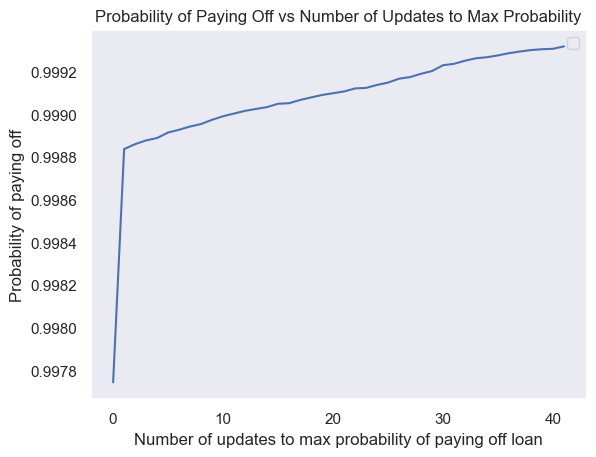

tot_hist [0.9993197944211051, 0.9993084408281258, 0.9993063662465493, 0.9993023831616638, 0.9992957685886916, 0.9992879312176708, 0.9992775616029234, 0.9992771485981009, 0.9992735630887148, 0.9992689434329202, 0.9992659552792851, 0.9992649089936683, 0.9992639888532329, 0.9992585735936762, 0.9992525267159379, 0.999251704483904, 0.9992514788070799, 0.9992494598289972, 0.9992479594330177, 0.9992473671930905, 0.9992451502146209, 0.9992439154293616, 0.9992379933915072, 0.9992356463993614, 0.9992348056129404, 0.9992325103055861, 0.9992320940164353, 0.9992317587643466, 0.9992313262962778, 0.9992295135377421, 0.9992281034419401, 0.9992244558251077, 0.9992219275989781, 0.9992210600857838, 0.9992207851223242, 0.9992186388051527, 0.999218293871736, 0.9992178470111557, 0.9992165289997574, 0.999216237824897, 0.999213967583623, 0.999213368777654, 0.999212113920419, 0.999211949110124, 0.9992089692400461, 0.9992057361400352, 0.9992046040881624, 0.9992042351678271, 0.9992036085220203, 0.999203469719385

In [133]:
sample = df_model.sample(1)
prediction = log_best.predict_proba(sample.drop(columns=target))[0]
print(log_best.predict_proba(sample.drop(columns=target))[0])

# i = 4
# while prediction[1] > 0.9 or prediction[1] < 0.5:
#     sample = df_model.sample(1, random_state=i)
#     prediction = log_best.predict_proba(sample.drop(columns=target))[0]
#     i += 1
# print('i = ', i)

# print('mod_feats: ', mod_feats_tmp)

print('original sample:')
print(sample[mod_feats].values.tolist()[0])

# print(f'Predicted probability of 0: {prediction[0]}')
# print(f'Predicted probability of 1: {prediction[1]}')
# print('Actual:', sample[target].values[0])
entry, max_prob, max_feats, max_hist, tot_hist = iterate(sample, target, log_best, mod_feats_tmp, all_vals)
print('Max probability of paying off:', max_prob)
print('Max features:', max_feats)
print(log_best.predict_proba(entry.drop(columns=target))[0])

plt.plot(max_hist)
# plt.plot(tot_hist, label='Total probability of paying off')
plt.xlabel('Number of updates to max probability of paying off loan')
plt.ylabel('Probability of paying off')
plt.title('Probability of Paying Off vs Number of Updates to Max Probability')
plt.legend()
plt.show()

print('tot_hist', sorted(tot_hist, reverse=True))
print('max_hist', sorted(max_hist))

[1.00000000e+00 3.20635938e-15]
original sample:
[20000.0, 20000.0, 20000.0, 664.2, 0.8660254037844386, 0.5000000000000001, 2014.0, 0.1199, 0.0, 1.0, 1.0]
6
Max probability of paying off: 5.201875471521169e-15
Max features: [0.6666666666666666, 0.9166666666666666, 2007.0, 0.05, 1.0, 0.0, 2.0]
[1.0000000e+00 1.5506817e-16]


/var/folders/qq/13ghpnzx0wl8wk7_7mrlpv8c0000gn/T/ipykernel_27004/3195768733.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


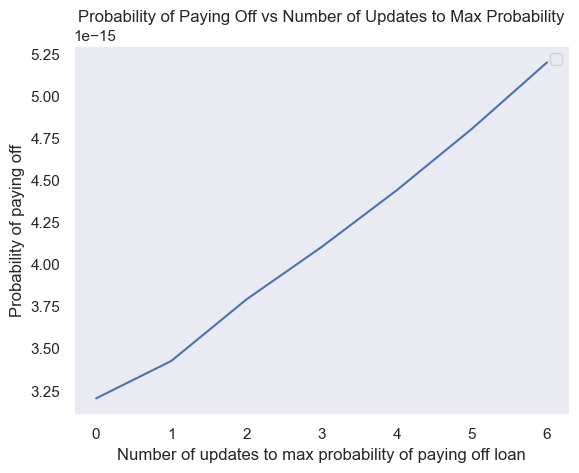

tot_hist [5.201875471521169e-15, 5.086909062147015e-15, 4.854285631840103e-15, 4.8071923071346074e-15, 4.700948772134935e-15, 4.5970533205918936e-15, 4.463061263097862e-15, 4.442455034590873e-15, 4.344272541194149e-15, 4.248259974546157e-15, 4.154369377196112e-15, 4.124434329059504e-15, 4.11457697638535e-15, 4.1053915619459565e-15, 4.0332803965773485e-15, 4.014658492779653e-15, 3.9259307109814646e-15, 3.83916389778795e-15, 3.819553781167917e-15, 3.8115001188482225e-15, 3.802390675493931e-15, 3.793902188241112e-15, 3.754314713922609e-15, 3.735137999583676e-15, 3.727262330882656e-15, 3.7183542149149405e-15, 3.710053331326547e-15, 3.6448862783755885e-15, 3.6280576141232715e-15, 3.6095258101130154e-15, 3.547874080476254e-15, 3.541948500171077e-15, 3.5297518470098936e-15, 3.5223092421725466e-15, 3.5138909618321873e-15, 3.476793619969568e-15, 3.4694626794003956e-15, 3.463668060071698e-15, 3.451740964578297e-15, 3.4444628484064996e-15, 3.4362306200908402e-15, 3.42855955146434e-15, 3.411046766

In [ ]:
sample = df_model.sample(1)
prediction = log_best.predict_proba(sample.drop(columns=target))[0]
print(log_best.predict_proba(sample.drop(columns=target))[0])

# i = 4
# while prediction[1] > 0.9 or prediction[1] < 0.5:
#     sample = df_model.sample(1, random_state=i)
#     prediction = log_best.predict_proba(sample.drop(columns=target))[0]
#     i += 1
# print('i = ', i)

# print('mod_feats: ', mod_feats_tmp)

print('original sample:')
print(sample[mod_feats].values.tolist()[0])

# print(f'Predicted probability of 0: {prediction[0]}')
# print(f'Predicted probability of 1: {prediction[1]}')
# print('Actual:', sample[target].values[0])
entry, max_prob, max_feats, max_hist, tot_hist = iterate(sample, target, log_best, mod_feats_tmp, all_vals)
print('Max probability of paying off:', max_prob)
print('Max features:', max_feats)
print(log_best.predict_proba(entry.drop(columns=target))[0])

plt.plot(max_hist)
# plt.plot(tot_hist, label='Total probability of paying off')
plt.xlabel('Number of updates to max probability of paying off loan')
plt.ylabel('Probability of paying off')
plt.title('Probability of Paying Off vs Number of Updates to Max Probability')
plt.legend()
plt.show()

print('tot_hist', sorted(tot_hist, reverse=True))
print('max_hist', sorted(max_hist))

[0.00435704 0.99564296]
original sample:
[18000.0, 18000.0, 18000.0, 612.23, 0.0, 1.0, 2015.0, 0.1366, 0.0, 1.0, 2.0]
8
Max probability of paying off: 0.9980314702193612
Max features: [0.6666666666666666, 0.9166666666666666, 2007.0, 0.05, 1.0, 0.0, 2.0]
[0.04543331 0.95456669]


/var/folders/qq/13ghpnzx0wl8wk7_7mrlpv8c0000gn/T/ipykernel_27004/3195768733.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


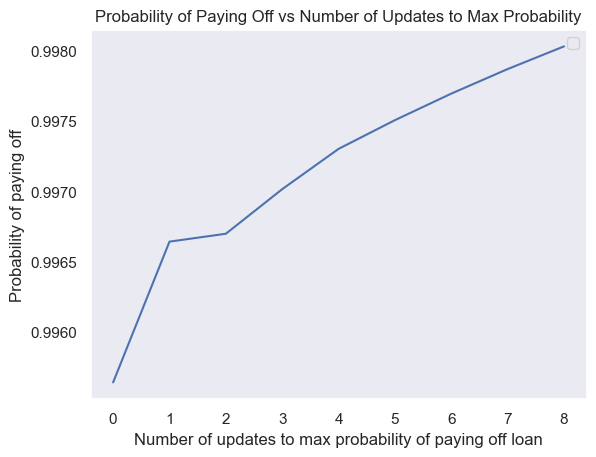

tot_hist [0.9980314702193612, 0.9979870701245209, 0.9978908114675946, 0.9978701929561803, 0.9978221631981268, 0.9977730527274095, 0.9977352456413291, 0.9976957331123459, 0.997643778360913, 0.997590655004552, 0.9975876967021745, 0.9975497589400752, 0.9975363368871202, 0.9975070183629934, 0.9974945211460794, 0.9974508194953707, 0.9973933570566468, 0.997390157136721, 0.997354695653738, 0.997349120968727, 0.9973346027877027, 0.9973313309339084, 0.9973028900423646, 0.9972950723121393, 0.9972893723190527, 0.9972745278042994, 0.9972421022667327, 0.9972282807261389, 0.997224278123066, 0.9972012037668587, 0.9971799483232326, 0.9971764871639723, 0.9971617236252774, 0.9971381307508274, 0.997132100991686, 0.9971163976846491, 0.9971128587530436, 0.9970916489213452, 0.9970736405072852, 0.9970674752712979, 0.9970632411350598, 0.9970576180418713, 0.9970514191496781, 0.99704780070858, 0.9970388320662337, 0.9970163471811219, 0.9970077013817403, 0.997001397643402, 0.9969970683880879, 0.9969849808284093, 

In [147]:
sample = df_model.sample(1)
prediction = log_best.predict_proba(sample.drop(columns=target))[0]
print(log_best.predict_proba(sample.drop(columns=target))[0])

# i = 4
# while prediction[1] > 0.9 or prediction[1] < 0.5:
#     sample = df_model.sample(1, random_state=i)
#     prediction = log_best.predict_proba(sample.drop(columns=target))[0]
#     i += 1
# print('i = ', i)

# print('mod_feats: ', mod_feats_tmp)

print('original sample:')
print(sample[mod_feats].values.tolist()[0])

# print(f'Predicted probability of 0: {prediction[0]}')
# print(f'Predicted probability of 1: {prediction[1]}')
# print('Actual:', sample[target].values[0])
entry, max_prob, max_feats, max_hist, tot_hist = iterate(sample, target, log_best, mod_feats_tmp, all_vals)
print('Max probability of paying off:', max_prob)
print('Max features:', max_feats)
print(log_best.predict_proba(entry.drop(columns=target))[0])

plt.plot(max_hist)
# plt.plot(tot_hist, label='Total probability of paying off')
plt.xlabel('Number of updates to max probability of paying off loan')
plt.ylabel('Probability of paying off')
plt.title('Probability of Paying Off vs Number of Updates to Max Probability')
plt.legend()
plt.show()

print('tot_hist', sorted(tot_hist, reverse=True))
print('max_hist', sorted(max_hist))

In [148]:
from itertools import product

def iterate(entry: pd.DataFrame, target: str, model: Pipeline, mod_feats: list, values: list):
    entry_cp = entry.copy(deep=True)
    mod_feats_cp = mod_feats.copy()
    values_cp = values.copy()
    max = model.predict_proba(entry_cp.drop(target, axis=1))[0][1]
    max_vals = entry_cp[mod_feats].values.tolist()[0]
    i = 0
    loan_amnts = init_loan_amnts(entry_cp)
    mod_feats_cp.append('loan_amnt')
    values_cp.append(loan_amnts)
    max_hist = [max]
    tot_hist = [max]
    updates = 0
    if max < 0.999:
        for p in product(*values_cp):
            if i % 1000 == 0:
                for feat, val in zip(mod_feats, p):
                    entry_cp[feat] = val

                P = entry_cp['loan_amnt'].values[0]
                n = 36 if entry_cp['term_num'].values[0] == 0 else 60
                r = entry_cp['int_rate_num'].values[0]

                entry_cp['funded_amnt'] = P
                entry_cp['funded_amnt_inv'] = P
                entry_cp['installment'] = P * (r*(1 + r)**n) / ((1 + r)**n - 1)

                pred = model.predict_proba(entry_cp.drop(target, axis=1))[0][1]
                tot_hist.append(max)
                
                if pred > max:
                    max_hist.append(pred)
                    max = pred
                    max_vals = entry_cp[mod_feats].values.tolist()[0]
                    updates += 1
            i += 1
        print(updates)

    return (entry_cp, max, max_vals, max_hist, tot_hist)

[0.00204545 0.99795455]
original sample:
[4800.0, 4800.0, 4800.0, 169.45, -0.8660254037844386, 0.5000000000000001, 2012.0, 0.1629, 0.0, 1.0, 1.0]
11
Max probability of paying off: 0.9993640753876907
Max features: [0.9166666666666666, 0.8333333333333334, 2007.0, 0.09, 0.0, 0.0, 0.0]
[0.00178316 0.99821684]


/var/folders/qq/13ghpnzx0wl8wk7_7mrlpv8c0000gn/T/ipykernel_27004/3550691690.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


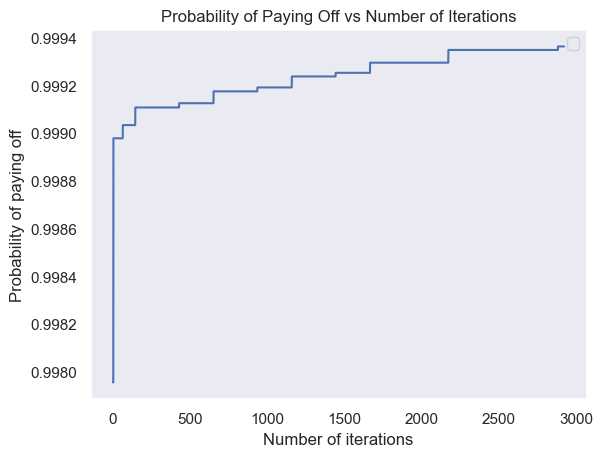

tot_hist [0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993640753876907, 0.9993493391863906, 0.9993493391863906, 0.9993493391863906, 0.9993493391863906, 0.9993493391863906, 0.9993493391863906, 0.9993493391863906, 0.9993493391863906, 0.9993493391863906, 0.99934933

In [166]:
sample = df_model.sample(1)
prediction = log_best.predict_proba(sample.drop(columns=target))[0]
print(log_best.predict_proba(sample.drop(columns=target))[0])

# i = 4
# while prediction[1] > 0.9 or prediction[1] < 0.5:
#     sample = df_model.sample(1, random_state=i)
#     prediction = log_best.predict_proba(sample.drop(columns=target))[0]
#     i += 1
# print('i = ', i)

# print('mod_feats: ', mod_feats_tmp)

print('original sample:')
print(sample[mod_feats].values.tolist()[0])

# print(f'Predicted probability of 0: {prediction[0]}')
# print(f'Predicted probability of 1: {prediction[1]}')
# print('Actual:', sample[target].values[0])
entry, max_prob, max_feats, max_hist, tot_hist = iterate(sample, target, log_best, mod_feats_tmp, all_vals)
print('Max probability of paying off:', max_prob)
print('Max features:', max_feats)
print(log_best.predict_proba(entry.drop(columns=target))[0])

plt.plot(tot_hist)
# plt.plot(tot_hist, label='Total probability of paying off')
plt.xlabel('Number of iterations')
plt.ylabel('Probability of paying off')
plt.title('Probability of Paying Off vs Number of Iterations')
plt.legend()
plt.show()

print('tot_hist', sorted(tot_hist, reverse=True))
print('max_hist', sorted(max_hist))

In [167]:
df_model.shape[0]

26535

[1.00000000e+00 6.55049878e-33]
original sample:
['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'installment', 'issue_d_month_x', 'issue_d_month_y', 'issue_d_year', 'int_rate_num', 'term_num', 'initial_list_status_num', 'verification_status_num']
[25900.0, 25900.0, 25900.0, 590.37, -0.4999999999999998, -0.8660254037844388, 2019.0, 0.1308, 1.0, 1.0, 0.0]
8
Max probability of paying off: 2.3054433115130504e-32
Max features: [0.6666666666666666, 0.9166666666666666, 2007.0, 0.05, 1.0, 0.0, 2.0]
[1.00000000e+00 2.60057597e-34]


/var/folders/qq/13ghpnzx0wl8wk7_7mrlpv8c0000gn/T/ipykernel_27004/3989824037.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


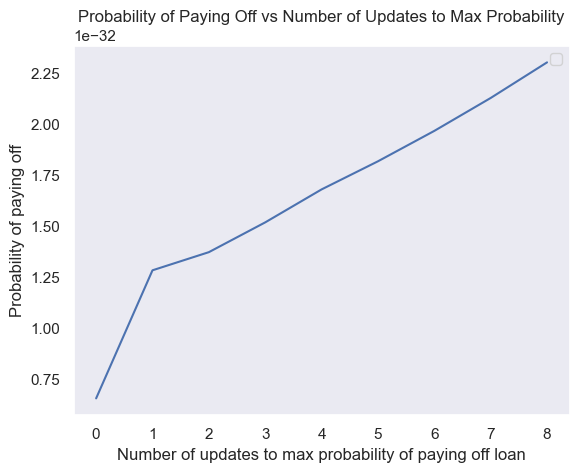

tot_hist [2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054433115130504e-32, 2.3054

In [188]:
sample = df_model.sample(1)
prediction = log_best.predict_proba(sample.drop(columns=target))[0]
print(log_best.predict_proba(sample.drop(columns=target))[0])

# i = 4
# while prediction[1] > 0.9 or prediction[1] < 0.5:
#     sample = df_model.sample(1, random_state=i)
#     prediction = log_best.predict_proba(sample.drop(columns=target))[0]
#     i += 1
# print('i = ', i)

# print('mod_feats: ', mod_feats_tmp)

print('original sample:')
print(mod_feats)
print(sample[mod_feats].values.tolist()[0])

# print(f'Predicted probability of 0: {prediction[0]}')
# print(f'Predicted probability of 1: {prediction[1]}')
# print('Actual:', sample[target].values[0])
entry, max_prob, max_feats, max_hist, tot_hist = iterate(sample, target, log_best, mod_feats_tmp, all_vals)
print('Max probability of paying off:', max_prob)
print('Max features:', max_feats)
print(log_best.predict_proba(entry.drop(columns=target))[0])

plt.plot(max_hist)
# plt.plot(tot_hist, label='Total probability of paying off')
plt.xlabel('Number of updates to max probability of paying off loan')
plt.ylabel('Probability of paying off')
plt.title('Probability of Paying Off vs Number of Updates to Max Probability')
plt.legend()
plt.show()

print('tot_hist', sorted(tot_hist, reverse=True))
print('max_hist', sorted(max_hist))